# Estudando hiperparâmetros encontrados via Optuna

Carregando *DataFrame* do Optuna

In [1]:
import optuna
import pandas as pd

study = optuna.load_study(study_name='lstm_layer', storage='sqlite:///lstm_layer.db')
dataframe: pd.DataFrame = study.trials_dataframe()
print(dataframe.columns)

/usr/local/lib/python3.8/dist-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Index(['number', 'value', 'datetime_start', 'datetime_complete', 'duration',
       'params_activation_function', 'params_adam_beta_1',
       'params_adam_beta_2', 'params_batch_size', 'params_learning_rate',
       'params_n_units', 'params_use_amsgrad', 'user_attrs_final_loss',
       'user_attrs_training_duration', 'state'],
      dtype='object')


Analisando os maiores *scores* obtidos, precisamos remover os casos mais absurdos, onde o *score* foi superior a 10^6! Esses *trials* serão removidos para melhor visualização.
(*Trials* com valores igual ao valor máximo do float32 ocorreram por conta do resultado final ser um NaN)

In [2]:
display(dataframe.sort_values(by='value', ascending=False).head(10))

,number,value,datetime_start,datetime_complete,duration,params_activation_function,params_adam_beta_1,params_adam_beta_2,params_batch_size,params_learning_rate,params_n_units,params_use_amsgrad,user_attrs_final_loss,user_attrs_training_duration,state
36,36,3.402823e+38,2023-07-11 05:33:04.516592,2023-07-11 05:34:53.773712,0 days 00:01:49.257120,relu,0.262,0.328,32,0.005987,197,False,12190.309570,105.977376,COMPLETE
48,48,3.402823e+38,2023-07-11 05:50:16.259718,2023-07-11 05:50:48.737335,0 days 00:00:32.477617,relu,0.947,0.194,128,0.017868,119,False,NaN,29.338556,COMPLETE
5,5,3.402823e+38,2023-07-11 03:48:56.567917,2023-07-11 03:49:58.964450,0 days 00:01:02.396533,tanh,0.986,0.791,32,0.009849,83,False,NaN,59.027789,COMPLETE
107,107,3.402823e+38,2023-07-11 19:27:53.585202,2023-07-11 19:30:03.752538,0 days 00:02:10.167336,selu,0.365,0.487,32,0.007773,229,False,331.134491,126.851597,COMPLETE
9,9,9.611017e+11,2023-07-11 03:51:58.668039,2023-07-11 03:52:40.816035,0 days 00:00:42.147996,selu,0.568,0.599,32,0.009261,17,False,1077.749023,39.084998,COMPLETE
4,4,2.400754e+10,2023-07-11 03:48:42.524875,2023-07-11 03:48:56.546703,0 days 00:00:14.021828,selu,0.216,0.470,128,0.017654,9,True,2.463240,10.945547,COMPLETE
88,88,2.331061e+08,2023-07-11 18:47:11.247799,2023-07-11 18:48:58.713389,0 days 00:01:47.465590,selu,0.646,0.423,32,0.002136,189,False,1.707210,104.183794,COMPLETE
1,1,1.627043e+06,2023-07-11 03:47:35.120635,2023-07-11 03:47:45.130443,0 days 00:00:10.009808,relu,0.306,0.233,256,0.002271,17,True,2.329081,6.933534,COMPLETE
126,126,4.294251e+02,2023-07-11 20:08:04.825563,2023-07-11 20:09:09.002370,0 days 00:01:04.176807,selu,0.327,0.760,64,0.001715,162,True,0.471030,60.965875,COMPLETE
15,15,1.777345e+02,2023-07-11 04:13:11.265175,2023-07-11 04:14:02.030268,0 days 00:00:50.765093,selu,0.653,0.723,64,0.000304,128,True,0.011273,47.577462,COMPLETE


In [3]:
dataframe = dataframe[dataframe['value'] < 1e6]

In [4]:
display(dataframe.sort_values(by='value', ascending=False).head(10))

,number,value,datetime_start,datetime_complete,duration,params_activation_function,params_adam_beta_1,params_adam_beta_2,params_batch_size,params_learning_rate,params_n_units,params_use_amsgrad,user_attrs_final_loss,user_attrs_training_duration,state
126,126,429.425097,2023-07-11 20:08:04.825563,2023-07-11 20:09:09.002370,0 days 00:01:04.176807,selu,0.327,0.760,64,0.001715,162,True,0.471030,60.965875,COMPLETE
15,15,177.734464,2023-07-11 04:13:11.265175,2023-07-11 04:14:02.030268,0 days 00:00:50.765093,selu,0.653,0.723,64,0.000304,128,True,0.011273,47.577462,COMPLETE
8,8,102.072112,2023-07-11 03:51:16.165969,2023-07-11 03:51:58.645348,0 days 00:00:42.479379,relu,0.517,0.772,32,0.034448,13,True,0.410654,39.077571,COMPLETE
26,26,71.208568,2023-07-11 04:27:51.418390,2023-07-11 04:28:45.178007,0 days 00:00:53.759617,sigmoid,0.458,0.891,64,0.001391,139,False,0.295674,50.580907,COMPLETE
19,19,69.183105,2023-07-11 04:20:39.771254,2023-07-11 04:21:01.968555,0 days 00:00:22.197301,relu,0.162,0.516,256,0.000067,99,True,0.364042,18.932714,COMPLETE
59,59,65.487188,2023-07-11 11:01:54.535445,2023-07-11 11:02:21.893600,0 days 00:00:27.358155,selu,0.586,0.504,256,0.002009,125,False,0.749401,24.010855,COMPLETE
38,38,65.222675,2023-07-11 05:35:55.530078,2023-07-11 05:36:42.864299,0 days 00:00:47.334221,relu,0.177,0.480,32,0.003943,47,True,0.104973,44.235435,COMPLETE
110,110,61.887270,2023-07-11 19:33:29.813821,2023-07-11 19:35:15.104320,0 days 00:01:45.290499,sigmoid,0.273,0.558,32,0.003784,177,True,2.394058,102.074162,COMPLETE
13,13,60.439649,2023-07-11 04:10:39.655945,2023-07-11 04:11:32.406611,0 days 00:00:52.750666,selu,0.100,0.272,64,0.000497,132,True,0.016512,49.590192,COMPLETE
105,105,57.882278,2023-07-11 19:17:36.940198,2023-07-11 19:19:04.006560,0 days 00:01:27.066362,tanh,0.399,0.511,32,0.003829,131,True,35.118881,83.673820,COMPLETE


Separando parâmetros e atributos de usuário.

Parâmetros -> Decididos pelo Optuna
Atributos de Usuário -> Armazenados por pedido do usuário

In [5]:
import re

param_regex = re.compile(r'^params_(.*)$')
user_attribute_regex = re.compile(r'^user_attrs_(.*)$')

# Extraindo parâmetros
raw_parameters = [col for col in dataframe.columns if param_regex.match(col)]
parameters = [param_regex.match(p).groups()[0] for p in raw_parameters]
# Extraindo atributos de usuário
raw_user_attributes = [col for col in dataframe.columns if user_attribute_regex.match(col)]
user_attributes = [user_attribute_regex.match(attr).groups()[0] for attr in raw_user_attributes]
print("Parâmetros:", parameters)
print("Atributos de usuário:", user_attributes)

Parâmetros: ['activation_function', 'adam_beta_1', 'adam_beta_2', 'batch_size', 'learning_rate', 'n_units', 'use_amsgrad']
Atributos de usuário: ['final_loss', 'training_duration']


## Correlação: o que causa melhora, o que causa piora

O *score* de cada *trial* do Optuna é definido como a média dos erros da predição realizada utilizando as redes treinadas. Logo, <span style="color: green">menor é melhor</span>

Correlações entre os parâmetros estudados e os valores obtidos no estudo (quanto menor, melhor, pois indica a média do erro obtido pela predição)

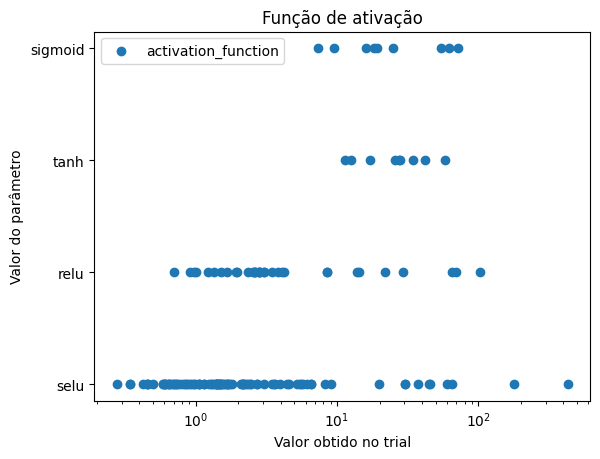

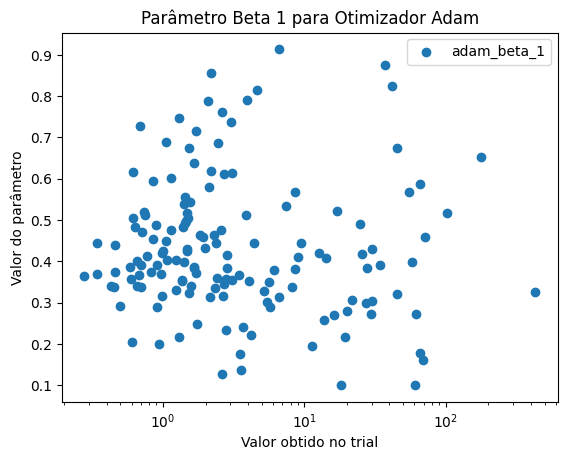

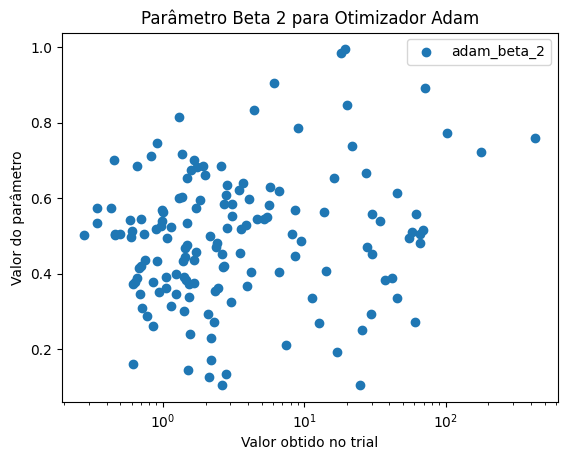

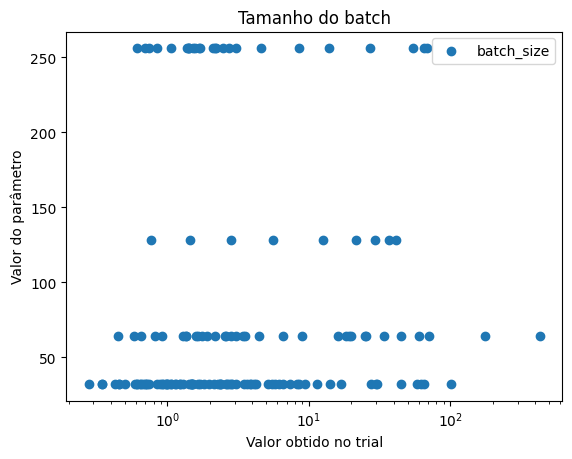

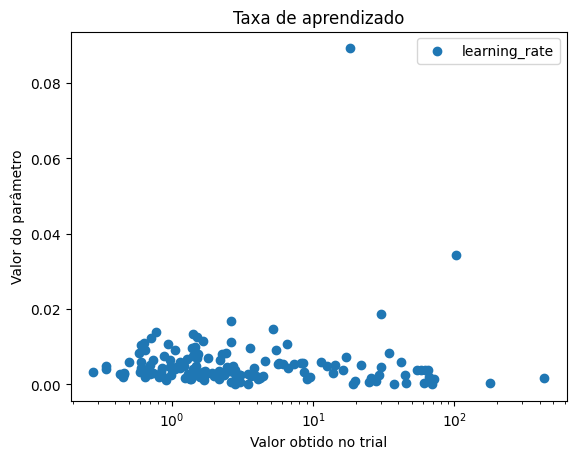

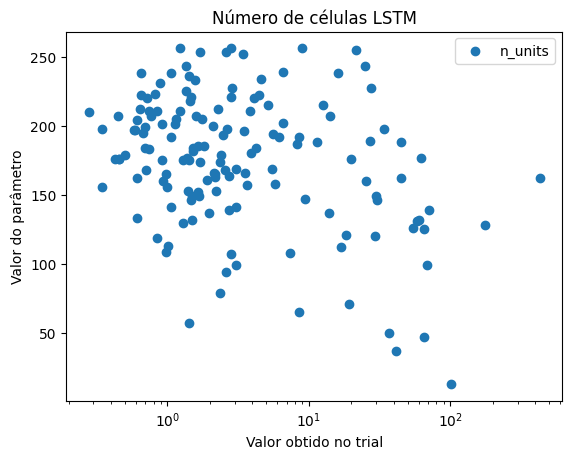

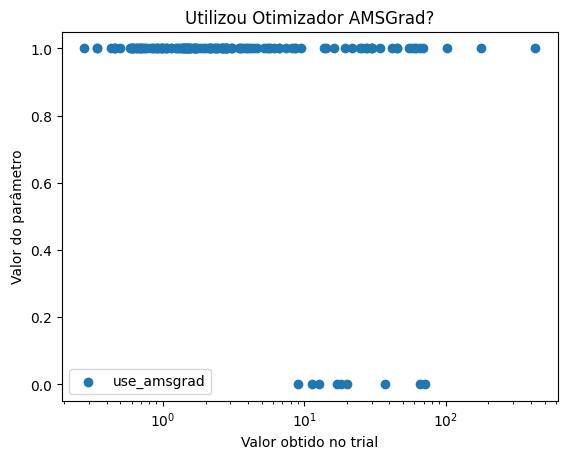

In [6]:
from matplotlib import pyplot as plt
import numpy as np


params_description = {
    'activation_function': 'Função de ativação',
    'adam_beta_1': 'Parâmetro Beta 1 para Otimizador Adam',
    'adam_beta_2': 'Parâmetro Beta 2 para Otimizador Adam',
    'batch_size': 'Tamanho do batch',
    'learning_rate': 'Taxa de aprendizado',
    'n_units': 'Número de células LSTM',
    'use_amsgrad': 'Utilizou Otimizador AMSGrad?'
}


for parameter in parameters:
    plt.scatter(dataframe['value'], dataframe[f'params_{parameter}'])
    plt.xscale('log')
    plt.xlabel('Valor obtido no trial')
    plt.ylabel('Valor do parâmetro')
    plt.title(f'{params_description[parameter]}')
    plt.legend([parameter])
    plt.show()

Algumas observações podem ser feitas visualmente, mas para melhorar a confiabilidade dos resultados, calcularemos a correlação entre cada hiperparâmetro e o *score* obtido, para evitar precipitações.

In [7]:
hyp_params_df = dataframe[raw_parameters]
activation_functions = pd.get_dummies(dataframe['params_activation_function'], dtype=int)
hyp_params_df = pd.concat([activation_functions, hyp_params_df.drop(columns=['params_activation_function'])], axis=1)
corr_dataframe = pd.concat([hyp_params_df, pd.Series(dataframe['value'])], axis=1)
corr_dataframe['params_use_amsgrad'] = pd.Series(corr_dataframe['params_use_amsgrad'], dtype=int)
display(corr_dataframe.corr().iloc[:-1][['value']].rename(columns={'value': 'Correlação'}))

,Correlação
relu,-0.030341
selu,-0.073524
sigmoid,0.109666
tanh,0.090613
params_adam_beta_1,-0.038160
params_adam_beta_2,0.196802
params_batch_size,0.001453
params_learning_rate,-0.010141
params_n_units,-0.227999
params_use_amsgrad,-0.095258


Hipóteses formadas antes de treinar uma rede de forma mais concreta:
- O uso de funções de ativação RELU e SELU contribuem para a diminuição do *score* (calculado como média do erro da predição, logo nesse caso, menor é melhor), enquanto as funções sigmóide e tangente hiperbólica, frequentementes aplicadas em redes neurais com propósito de classificação, não apresentam bons resultados.
- A mudança do parâmetro $\beta_1$ no otimizador Adams não apresentou grande diferença no resultado final, enquanto um aumento no parâmetro $\beta_2$ causou aumentos consideráveis no *score*.
- O uso do otimizador [AMSGrad](https://paperswithcode.com/paper/on-the-convergence-of-adam-and-beyond-1) melhorou de forma considerável os resultados obtidos.

Já as outras correlações apresentam resultados já esperados:
- É comum que a redução do tamanho do *batch* utilizado melhore os resultados obtidos. No entanto, essa escolha impacta de forma considerável o tempo necessário para treinamento, como será avaliado posteriormente.
- Uma taxa de aprendizado menor evita que o treinamento fique preso em mínimos locais, mas também causa incremento no tempo de treinamento.
- Uma maior quantidade de células LSTM aumenta a capacidade de tomada de decisão da rede neural treinada, ao custo de diminuir de forma considerável a capacidade de generalização da rede. Isto é, quanto mais células presentes, maior a dificuldade de generalizar o comportamento denotado pelos dados de treino à dados do mundo real.

## Avaliando impacto na duração do treinamento

Alguns hiperparâmetros melhoram consideravelmente o *score* obtido. No entanto, os *trials* do Optuna são feitos com número de *epochs* baixíssimo, tal como uma baixa quantidade de dados no conjunto de treino. Logo, antes de testar os hiperparâmetros obtidos em um treinamento mais extenso, é necessário avaliar o impacto de cada hiperparâmetro nesse processo.

Nota: o *dataframe* do Optuna contém uma coluna chamada 'duration'. No entanto, essa coluna apresenta a duração da *trial* em si, e não do treinamento do modelo. Para tal, foi criado um atributo de usuário, e esse será utilizado.

In [8]:
hyp_params_df = dataframe[raw_parameters]
activation_functions = pd.get_dummies(dataframe['params_activation_function'], dtype=int)
hyp_params_df = pd.concat([activation_functions, hyp_params_df.drop(columns=['params_activation_function'])], axis=1)
corr_dataframe = pd.concat([hyp_params_df, pd.Series(dataframe['user_attrs_training_duration'])], axis=1)
corr_dataframe['params_use_amsgrad'] = pd.Series(corr_dataframe['params_use_amsgrad'], dtype=int)
display(
    corr_dataframe
      .corr()
      .iloc[:-1][['user_attrs_training_duration']]
      .apply(lambda x: x * 100, axis=1)
      .rename(columns={'user_attrs_training_duration': 'Correlação (%)'}))

,Correlação (%)
relu,-1.587594
selu,9.639593
sigmoid,-10.281155
tanh,-6.180411
params_adam_beta_1,-28.855761
params_adam_beta_2,3.081316
params_batch_size,-72.635946
params_learning_rate,-1.713387
params_n_units,49.118807
params_use_amsgrad,15.307052


A tabela de correlação apresentada confirma o que foi dito na análise anterior.

### Estimando tempo de treinamento total da rede

Utilizando como base a duração do treinamento para o melhor *trial*

In [9]:
best_trial_duration = study.best_trial.duration
# Epochs: 50 -> 400 (* 8)
# Conjunto de treinamento: 256 -> 1024 (* 4)
# Como o treinamento é feito utilizando instruções SIMD paralelizadas
# não podemos afirmar que a duração de cada epoch crescerá de forma linear
# No entanto, essa é a estimativa mais pessimista possível.
estimated_duration = best_trial_duration * 8 * 4
print(estimated_duration)

1:10:34.762848


Como podemos analisar, a estimativa pessimista de tempo de treinamento de uma rede neural LSTM utilizando os mesmos hiperparâmetros utilizados na melhor *trial* é bem alta, demorando cerca de 1 hora para conclusão do treinamento. No entanto, utilizando uma arquitetura altamente paralelizável como a arquietura CUDA, suportada pelo *Tensorflow*, é possível reduzir considervalmente esse tempo.

# Definindo hiperparâmetros utilizados

Visto que o tempo de treinamento de redes LSTM é consideravelmente demorado, iremos criar apenas um modelo para treinamento. Para escolher os hiperparâmetros utilizados nesse modelo, vamos primeiro analisar todas as *trials* que apresentaram um score abaixo de 1.

In [10]:
best_n_trials = dataframe.sort_values(by='value', ascending=True)[dataframe['value'] < 1]
display(best_n_trials)

/tmp/ipykernel_301/3342128385.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  best_n_trials = dataframe.sort_values(by='value', ascending=True)[dataframe['value'] < 1]


,number,value,datetime_start,datetime_complete,duration,params_activation_function,params_adam_beta_1,params_adam_beta_2,params_batch_size,params_learning_rate,params_n_units,params_use_amsgrad,user_attrs_final_loss,user_attrs_training_duration,state
155,155,0.277850,2023-07-11 21:13:17.354189,2023-07-11 21:15:29.690528,0 days 00:02:12.336339,selu,0.365,0.502,32,0.003264,210,True,0.000605,129.051952,COMPLETE
99,99,0.342789,2023-07-11 19:06:49.079968,2023-07-11 19:08:27.172086,0 days 00:01:38.092118,selu,0.370,0.575,32,0.004963,156,True,0.002857,94.922848,COMPLETE
83,83,0.343295,2023-07-11 18:37:27.395875,2023-07-11 18:39:27.263057,0 days 00:01:59.867182,selu,0.445,0.535,32,0.004168,198,True,0.001033,116.529369,COMPLETE
97,97,0.427345,2023-07-11 19:03:18.744129,2023-07-11 19:05:03.319941,0 days 00:01:44.575812,selu,0.340,0.574,32,0.002639,176,True,0.005489,101.394063,COMPLETE
121,121,0.450366,2023-07-11 20:01:21.918729,2023-07-11 20:02:40.260447,0 days 00:01:18.341718,selu,0.338,0.702,64,0.001929,207,True,0.012202,75.039652,COMPLETE
93,93,0.456094,2023-07-11 18:56:22.794167,2023-07-11 18:58:07.682712,0 days 00:01:44.888545,selu,0.373,0.505,32,0.002964,176,True,0.002000,101.707494,COMPLETE
92,92,0.457847,2023-07-11 18:54:39.370804,2023-07-11 18:56:22.775606,0 days 00:01:43.404802,selu,0.440,0.502,32,0.002767,176,True,0.003729,100.222187,COMPLETE
98,98,0.498601,2023-07-11 19:05:03.338473,2023-07-11 19:06:49.061073,0 days 00:01:45.722600,selu,0.293,0.506,32,0.006021,179,True,0.019348,102.517478,COMPLETE
118,118,0.585225,2023-07-11 19:48:37.434808,2023-07-11 19:49:53.454009,0 days 00:01:16.019201,selu,0.387,0.542,64,0.008323,197,True,0.013983,72.742506,COMPLETE
154,154,0.592638,2023-07-11 21:11:16.411641,2023-07-11 21:13:17.331671,0 days 00:02:00.920030,selu,0.357,0.498,32,0.003285,197,True,0.001219,117.661223,COMPLETE


Algumas escolhas arbitrárias realizadas:
- Ignorar *trials* com função de ativação RELU, mantendo apenas as que utilizam SELU, visto que essa monopolizou os melhores resultados.
- Manter apenas *trials* que utilizaram tamanho de *batch* igual a 256, visto que conseguiram apresentar bons resultados com um tempo de treinamento muito menor.

Aplicando esses filtros, obtemos os seguintes hiperparâmetros:

In [11]:
best_n_trials = best_n_trials[best_n_trials['params_batch_size'] == 256]
best_n_trials = best_n_trials[best_n_trials['params_activation_function'] == 'selu']
display(best_n_trials)

,number,value,datetime_start,datetime_complete,duration,params_activation_function,params_adam_beta_1,params_adam_beta_2,params_batch_size,params_learning_rate,params_n_units,params_use_amsgrad,user_attrs_final_loss,user_attrs_training_duration,state
60,60,0.609628,2023-07-11 11:02:21.912258,2023-07-11 11:03:04.209066,0 days 00:00:42.296808,selu,0.617,0.372,256,0.004437,204,True,0.020757,38.992486,COMPLETE
62,62,0.691582,2023-07-11 11:03:43.829000,2023-07-11 11:04:21.794528,0 days 00:00:37.965528,selu,0.727,0.346,256,0.003742,184,True,0.013331,34.702418,COMPLETE
56,56,0.742686,2023-07-11 11:00:02.001577,2023-07-11 11:00:45.952522,0 days 00:00:43.950945,selu,0.513,0.436,256,0.002981,211,True,0.010614,40.466674,COMPLETE
73,73,0.849261,2023-07-11 11:10:46.339369,2023-07-11 11:11:30.514779,0 days 00:00:44.175410,selu,0.595,0.261,256,0.004259,211,True,0.011533,40.840682,COMPLETE


O restante dos parâmetros não apresentou grande variação. Ao invés de escolher uma das *trials* para replicar, iremos aplicar uma média ponderada utilizando como peso o inverso do *score*.

In [12]:
weights = best_n_trials['value'].apply(lambda val: val ** (-1))
weights_sum = np.sum(weights)
beta_1 = best_n_trials['params_adam_beta_1']
beta_2 = best_n_trials['params_adam_beta_2']
learning_rate = best_n_trials['params_learning_rate']
n_units = best_n_trials['params_n_units']
beta_1_weighted_mean = np.dot(beta_1, weights) / weights_sum
beta_2_weighted_mean = np.dot(beta_2, weights) / weights_sum
learning_rate_weighted_mean = np.dot(learning_rate, weights) / weights_sum
n_units_weighted_mean = int(np.dot(n_units, weights) / weights_sum)
print(beta_1_weighted_mean)
print(beta_2_weighted_mean)
print(learning_rate_weighted_mean)
print(n_units_weighted_mean)

0.615773425792124
0.3573619669868727
0.0038708747193081138
201


Portanto, finalizamos a definição de hiperparâmetros com:
- Função de ativação: SELU (*Scaled Exponential Linear Unit*)
- $\beta_1$: 0.615773425792124
- $\beta_2$: 0.3573619669868727
- Tamanho de *batch*: 256
- Taxa de aprendizado ($\eta$): 0.0038708747193081138
- Quantidade de células LSTM: 201

# Treinando rede

Antes de treinar a rede formulada, precisamos gerar dados de treino utilizados pela mesma. Uma rede LSTM necessita de uma entrada denotada por uma sequência de valores, chamados de *timesteps*. O formato dos dados de entrada é dado por:

shape = (samples, timesteps, features)
shape = (s, t, f)

Isto é, cada *sample* s possui apresentam t *timesteps* de f *features*.

Imagine que um sistema de EDO, com duas equações, já resolvido de forma numérica, seja o seguinte:

$$u =
\begin{bmatrix}
1.5 & 2.1 \\
1.8 & 2.2 \\
2.0 & 2.5 \\
2.1 & 2.9 \\
2.3 & 3.4
\end{bmatrix}
$$

Se quisermos que a nossa rede LSTM seja capaz de prever o próximo valor desse sistema com base nas entradas já disponíveis, podemos treinar a rede ao fazer o *fit* com input:

$$u_{input}=
\begin{bmatrix}
1.5 & 2.1 \\
1.8 & 2.2 \\
2.0 & 2.5 \\
2.1 & 2.9
\end{bmatrix}
\quad\text{e output}\quad
u_{output}
\begin{bmatrix}
2.3 & 3.4
\end{bmatrix}
$$

Nesse caso, escolhemos de forma arbitrária uma determinada quantidade de *timesteps* para separar o input do output. No entanto, se reduzirmos essa quantidade de *timesteps* em uma unidade, aumentaremos a cardinalidade do conjunto de treino, com inputs:

$$u_{input}^1=
\begin{bmatrix}
1.5 & 2.1 \\
1.8 & 2.2 \\
2.0 & 2.5
\end{bmatrix}
\quad
u_{input}^2=
\begin{bmatrix}
1.8 & 2.2 \\
2.0 & 2.5 \\
2.1 & 2.9
\end{bmatrix}
$$

e outputs:

$$u_{output}^1=
\begin{bmatrix}
2.1 & 2.9
\end{bmatrix}
\quad
u_{output}^2=
\begin{bmatrix}
2.3 & 3.4
\end{bmatrix}
$$

respectivamente.

Portanto, o tamanho do conjunto de treino é dado pelo:
- Número de sistemas de EDOs resolvidos numericamente utilizados como base
- O tamanho da sequência de cada sistema resolvido numericamente
- O tamanho da sequência utilizada para prever o próximo passo

## Gerando dados de treino


Definindo o sistema de EDO a ser resolvido

In [17]:
def simple_spectrum(x1_x2, t0):
    x1, x2 = x1_x2
    return [- 0.05 * x1, - 1.0 * (x2 - x1 ** 2)]

Constantes para treinamento:

- ODEFUN: função que dá o sistema de EDOs
- ODEFUN_SIZE: quantidade de equações no sistema
- TRAINING_SYSTEMS: quantidade de sistemas resolvidos e utilizados para gerar os dados de treino
- EPOCHS: número de *epochs*
- X0_SCALE_TRAINING: amplitude das condições iniciais geradas
- INTEGRATION_DOMAIN: domínio de integração dos sistemas utilizados como dados de treino
- TIMESTEPS_PER_SYSTEM: quantidade de *timesteps* por sistema

In [18]:
ODEFUN = simple_spectrum
ODEFUN_SIZE = 2
TRAINING_SYSTEMS = 1024
EPOCHS = 400
X0_SCALE_TRAINING = 10.0
INTEGRATION_DOMAIN = np.arange(0, 10 + 0.1, 0.1)
TIMESTEPS_PER_SYSTEM = len(INTEGRATION_DOMAIN)

As funções abaixo serão utilizadas para geração dos dados de treino e teste.

In [19]:
from scipy.integrate import odeint

def separate_groups(x: np.ndarray, size: int):
    if (len(x.shape) != 2):
        raise ValueError(
            f'Expected ndims=2, but got ndims={len(x.shape)}.')

    n_rows = x.shape[0]
    n_columns = x.shape[1]

    if (n_rows <= size):
        raise ValueError(
            f'Unable to split input and output group.')

    n_groups = n_rows - size
    groups = np.zeros((n_groups, size, n_columns))
    groups_output = np.zeros((n_groups, 1, n_columns))
    for i in range(n_groups):
        groups[i, :, :] = x[i:i + size, :]
        groups_output[i, :, :] = x[i + size, :]
    return groups, groups_output


def random_with_scale(shape: tuple, scale: float):
    return np.random.normal(loc=0.0, scale=scale, size=shape)

def generate_training_data(trailing_timesteps):
    x0_training = random_with_scale(
        (TRAINING_SYSTEMS, 2), X0_SCALE_TRAINING)
    x_training = np.asarray(
        [odeint(ODEFUN, x0_j, INTEGRATION_DOMAIN) for x0_j in x0_training])
    samples_per_system = TIMESTEPS_PER_SYSTEM - trailing_timesteps
    total_samples = samples_per_system * TRAINING_SYSTEMS
    training_input = np.zeros(
        (total_samples, trailing_timesteps, ODEFUN_SIZE))
    training_output = np.zeros((total_samples, 1, ODEFUN_SIZE))
    for system_index in range(TRAINING_SYSTEMS):
        system_timesteps = x_training[system_index, :, :]
        system_input_groups, system_outputs = separate_groups(
            system_timesteps, trailing_timesteps)
        lower_bound = system_index * samples_per_system
        upper_bound = (system_index + 1) * samples_per_system
        training_input[lower_bound:upper_bound, :, :] = system_input_groups
        training_output[lower_bound:upper_bound, :, :] = system_outputs
    return training_input, training_output.squeeze()

def predict(x_validation, model, trailing_timesteps):
    prediction = np.zeros_like(x_validation)
    prediction[:, 0:trailing_timesteps,
               :] = x_validation[:, 0:trailing_timesteps, :]
    for k in range(trailing_timesteps, TIMESTEPS_PER_SYSTEM):
        lower_bound = k - trailing_timesteps
        upper_bound = k
        prediction[:, k, :] = model.predict(
            prediction[:, lower_bound:upper_bound, :], verbose=0)
    return prediction

Gerando os dados de treinamento

In [20]:
TRAINING_INPUT, TRAINING_OUTPUT = generate_training_data(5)

Validando *shapes* utilizados

In [22]:
print(TRAINING_INPUT.shape)
print(TRAINING_OUTPUT.shape)

(98304, 5, 2)
(98304, 2)


Como o modelo realiza um mapeamento

$$\mathbb{R}^{(m,\ 2)}\rightarrow\mathbb{R}^2$$

logo as *shapes* estão corretas. Note que $m$ é variável, mas para facilitar o processo de treinamento, padronizamos que os dados de treinamento serão dados em matrizes $5\times 2$

## Modelando rede

Utilizando os parâmetros decididos anteriormente

In [68]:
from keras import Sequential
from keras.layers import LSTM, Dense
from keras.optimizers import Adam

model = Sequential()
model.add(LSTM(201, activation="selu", input_shape=(None, 2), return_sequences=False))
model.add(Dense(2, activation="linear"))
model.compile(
    loss="mse",
    optimizer=Adam(
        beta_1=0.615773425792124,
        beta_2=0.3573619669868727,
        learning_rate=0.0038708747193081138,
        amsgrad=True
    )
)

## Treinando rede

Vai demorar!

In [ ]:
from time import time
import h5py

# Se existe arquivo contendo modelo em trained_models/model.h5:
# Não treina a rede, mas carrega esse modelo salvo.
# Caso contrário, treina a rede e salva o modelo em trained_models/model.h5
try:
    model.load_weights('trained_models/model.h5')
    # Histórico do *loss*
    losses = None
    try:
        with h5py.File('trained_models/loss_history.h5', 'r') as hf:
            losses = hf['loss_history'][:]
    except OSError:
        print('Não há arquivo contendo histórico de loss.')
except OSError:
    history = model.fit(
        TRAINING_INPUT,
        TRAINING_OUTPUT,
        shuffle=True,
        batch_size=256,
        epochs=400,
        verbose=1,
    )
    model.save_weights('trained_models/model.h5')
    losses = history.history['loss']
    with h5py.File('trained_models/loss_history.h5', 'w') as hf:
        hf.create_dataset('loss_history', data=losses)

Abaixo está o gráfico do histórico do *loss*

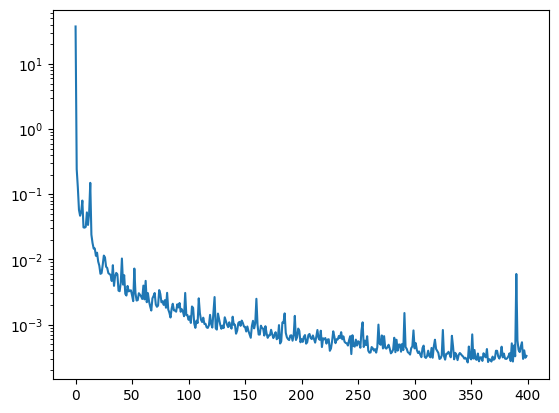

In [75]:
from matplotlib import pyplot as plt

plt.plot(losses)
plt.yscale('log')

Nota-se que apesar dos variados picos obtidos durante o treinamento, o *loss* continuou a cair. Como o tempo de treinamento com 400 *epochs* foi muito menor do que o esperado (durando apenas cerca de 22 minutos), a rede foi treinada por mais 100 *epochs*. Para evitar que esse comportamento permaneça no restante do treinamento, iremos utilizar um *callback* da biblioteca Keras que permite reduzir o *learning rate* utilizado conforme uma das métricas não apresenta melhoria (no caso, o *loss*)

In [71]:
from keras.callbacks import ReduceLROnPlateau

# Reduz o learning rate em em 2x para cada 5 epochs que não apresenta melhora no loss.
# LR mínimo será de 1e-5.
learning_rate_callback = ReduceLROnPlateau(monitor='loss', factor=0.5, patience=5, min_lr=1e-5)

In [ ]:
history_after_400 = model.fit(
    TRAINING_INPUT,
    TRAINING_OUTPUT,
    shuffle=True,
    batch_size=256,
    epochs=100,
    verbose=1,
    callbacks=[learning_rate_callback]
)
model.save_weights('trained_models/model_500_epochs.h5')
losses_500 = np.append(losses, history_after_400.history['loss'])
with h5py.File('trained_models/loss_history_500_epochs.h5', 'w') as hf:
    hf.create_dataset('loss_history', data=losses_500)

Plot do *loss* com as novas 100 *epochs*

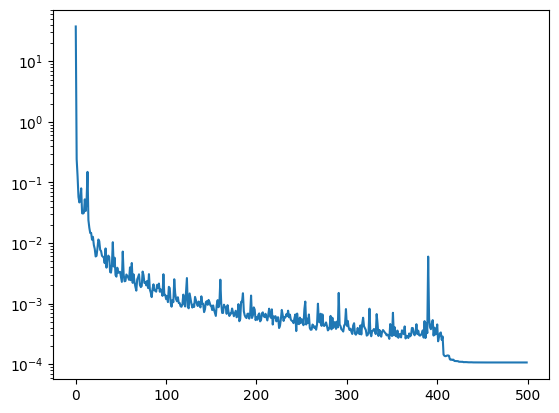

In [77]:
from matplotlib import pyplot as plt

plt.plot(losses_500)
plt.yscale('log')

O *loss* atingiu convergência ao reduzir a taxa de aprendizado, estagnando em um valor pouco acima de 1e-4.

# Testando modelo treinado


Comparando desempenho da redes em diferentes amplitudes, com $x_0 \in$:

- Presentes no treinamento:
  - $[-1, 1]$
  - $[-3, 3]$
  - $[-5, 5]$
  - $[-10, 10]$
- Não presentes no treinamento:
  - $[-12, 12]$
  - $[-15, 15]$
  - $[-20, 20]$

Utilizando random state = 20140708 para permitir replicação.

20140708 -> Descubra o motivo.

In [ ]:
import numpy as np
from scipy.integrate import odeint

N_TEST_EXAMPLES = 256  # Teste para cada amplitude, nem todos serão plotados em gráfico
BOUNDS = [1, 3, 5, 10, 12, 15, 20]  # Diferentes amplitudes utilizadas

np.random.seed(20140708)

x_validation = dict()
for bound in BOUNDS:
    x0_validation = random_with_scale((N_TEST_EXAMPLES, 2), bound)
    x_validation[bound] = np.asarray(
        [odeint(simple_spectrum, x0_j, INTEGRATION_DOMAIN) for x0_j in x0_validation])

predictions = dict()
for k, v in x_validation.items():
    predictions[k] = np.zeros_like(v)
    # Primeiros 5 valores, visto que a rede foi treinada para receber entradas com sequência de 5 valores
    predictions[k][:, 0:5, :] = v[:, 0:5, :]
    for j in range(5, len(INTEGRATION_DOMAIN)):
        predictions[k][:, j, :] = model.predict(
            predictions[k][:, j - 5:j, :])

[OPCIONAL] (salvando dados de predição)

In [94]:
import h5py

with h5py.File(f"predictions_result/model_prediction.h5", "w") as f:
  for k, v in predictions.items():
    f.create_dataset(f"{k}", data=v)

[OPCIONAL] (carregando dados de predição)

In [95]:

predictions_i = dict()
with h5py.File(f"predictions_result/model_prediction.h5", "r") as f:
  for k, v in f.items():
    predictions_i[int(k)] = np.asarray(v)

Selecionando exemplos que serão plotados.

Serão plotados apenas 10, logo é necessário permutar a ordem dos índices de 0..255 e escolher os 10 primeiros.

Como temos 7 amplitudes diferentes, escolhemos os primeiros 70 índices.

In [100]:
idx_permutation = np.arange(0, 256)
np.random.shuffle(idx_permutation)
bounds_idx = dict()
for i, bound in enumerate(BOUNDS):
    bounds_idx[bound] = idx_permutation[10 * i: 10 * i + 10]

## Gráficos

### Componentes x Tempo

Utilizando apenas os índices aleatórios gerados via permutação

### Amplitude x0 em [-1, 1]

<Figure size 640x480 with 0 Axes>

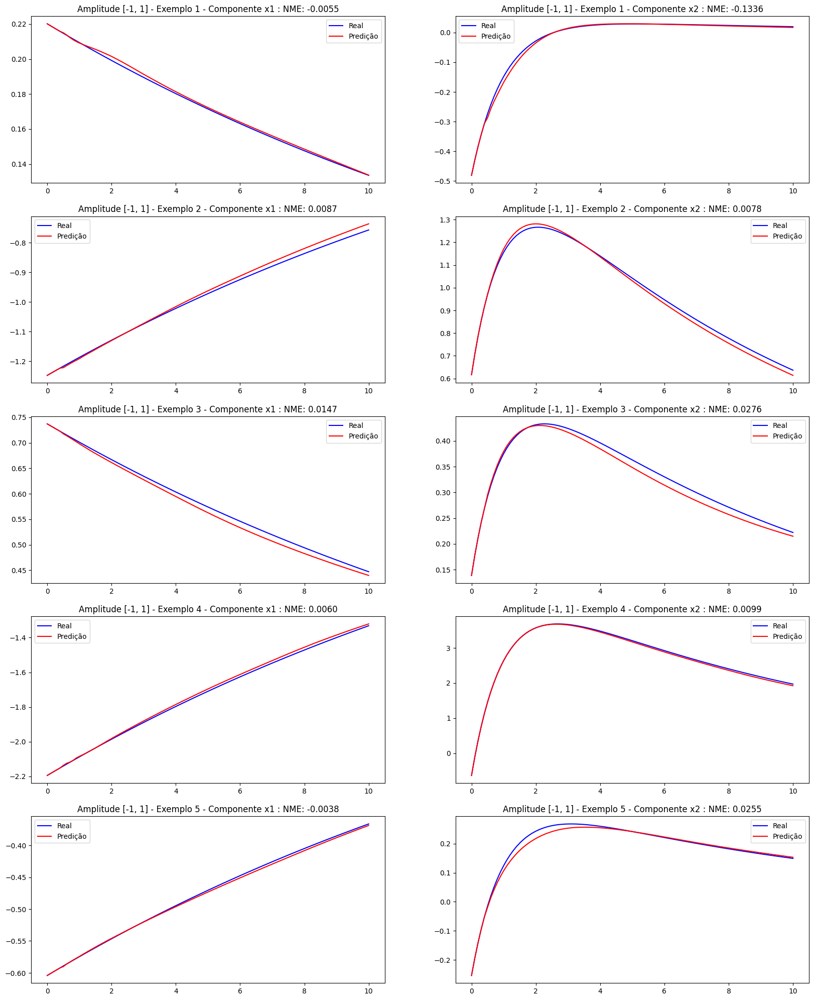

### Amplitude x0 em [-3, 3]

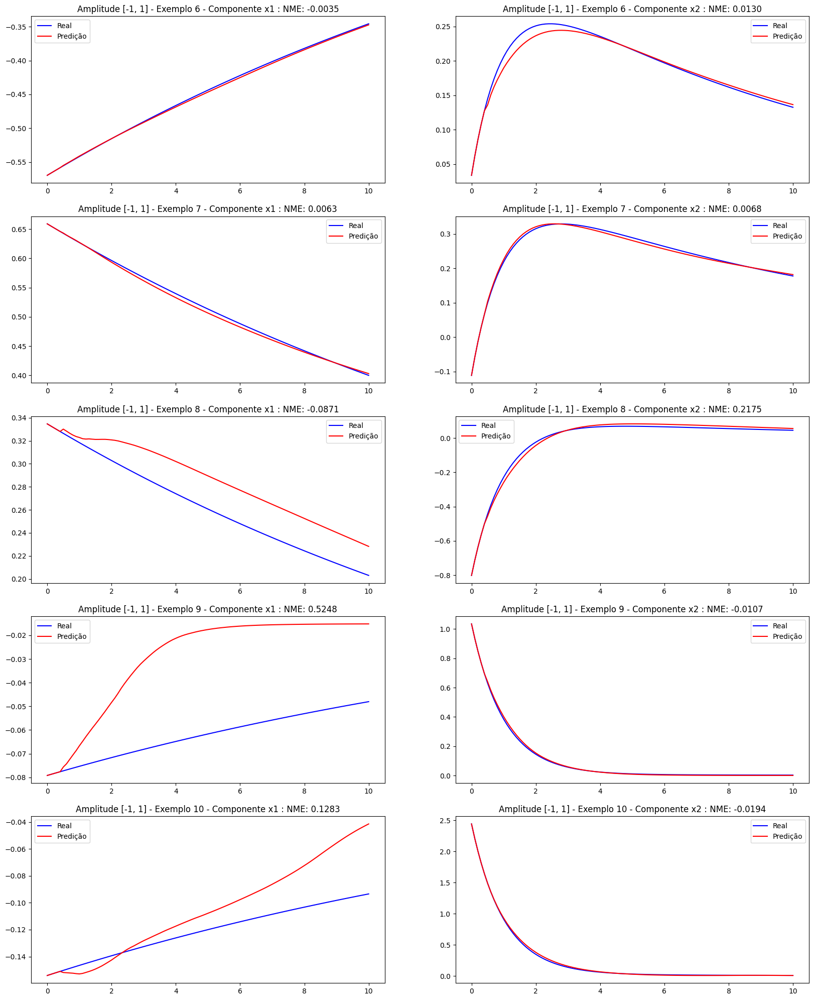

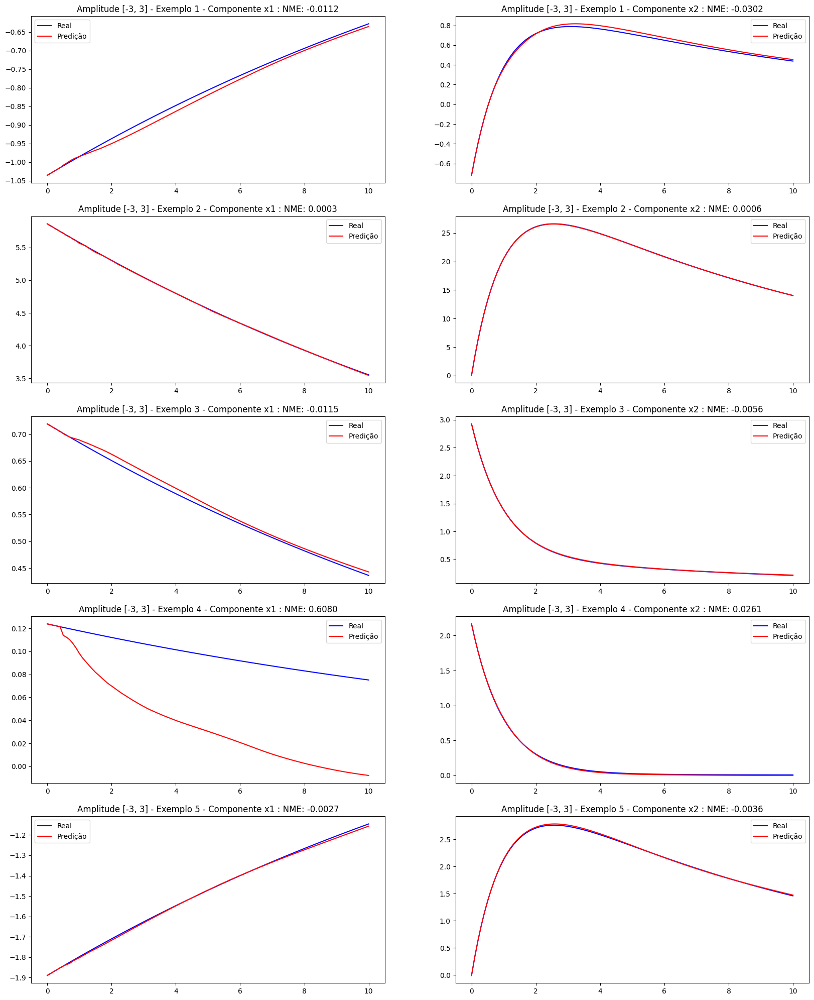

### Amplitude x0 em [-5, 5]

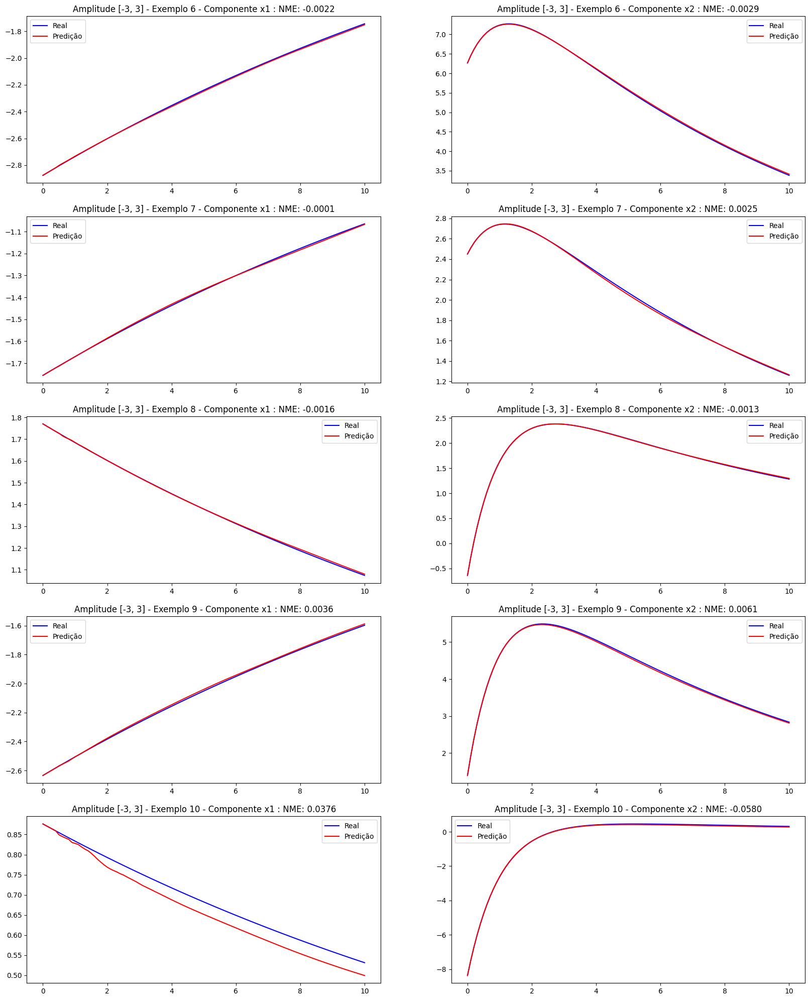

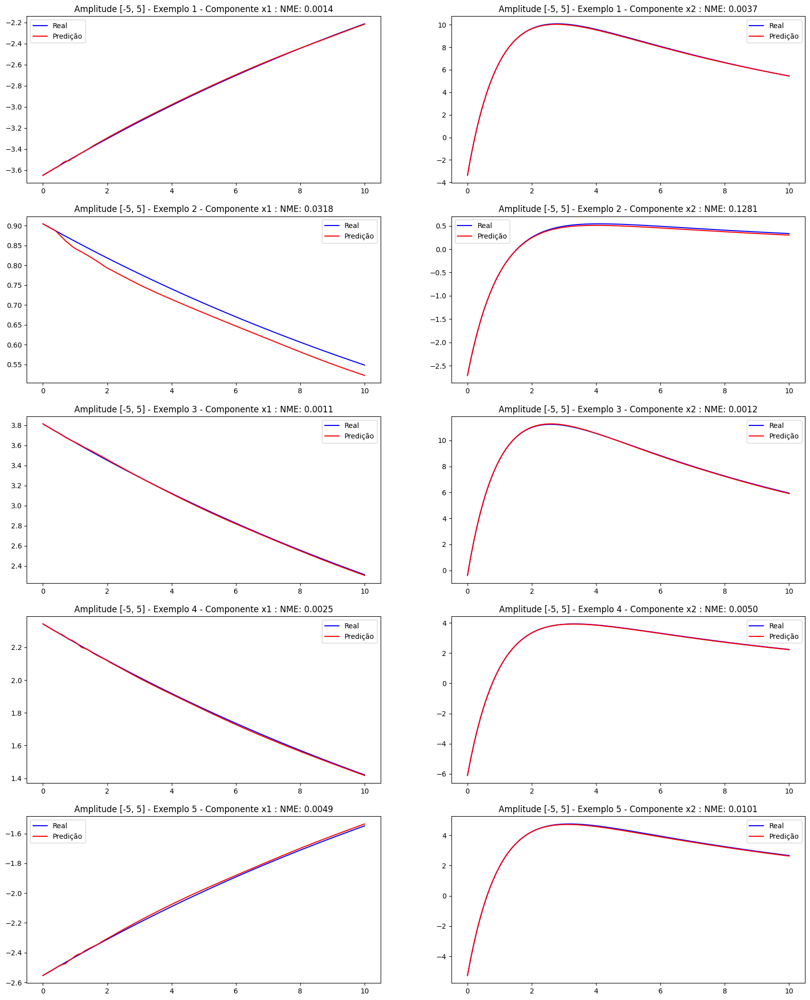

### Amplitude x0 em [-10, 10]

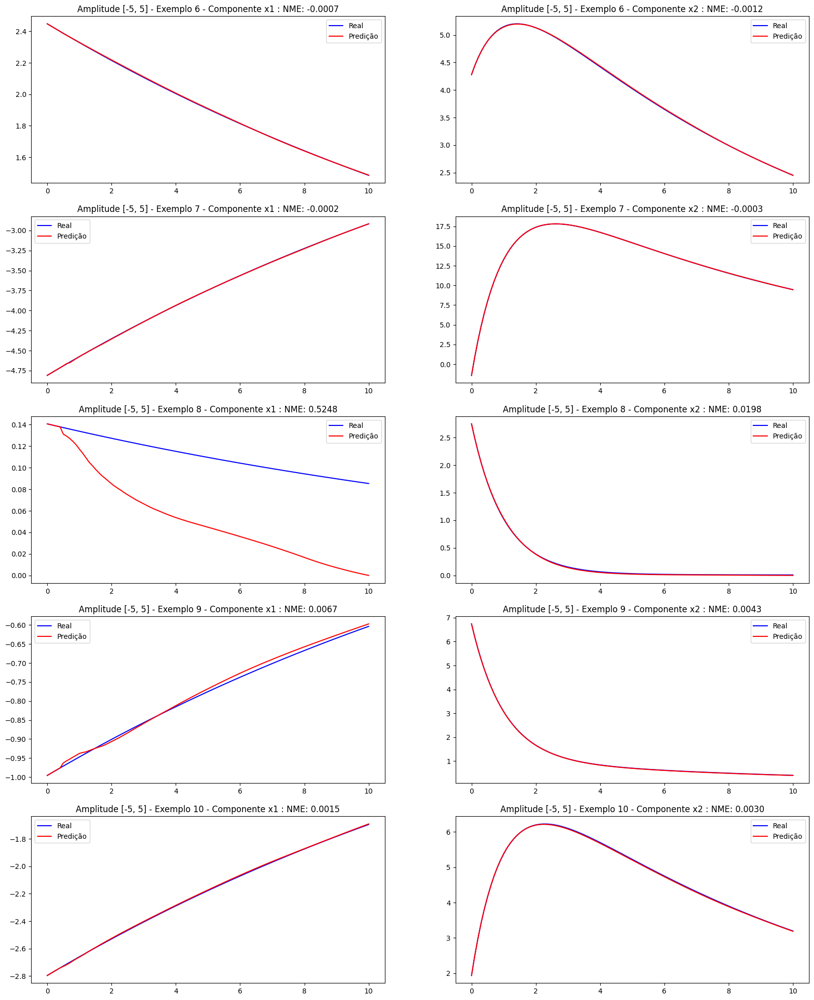

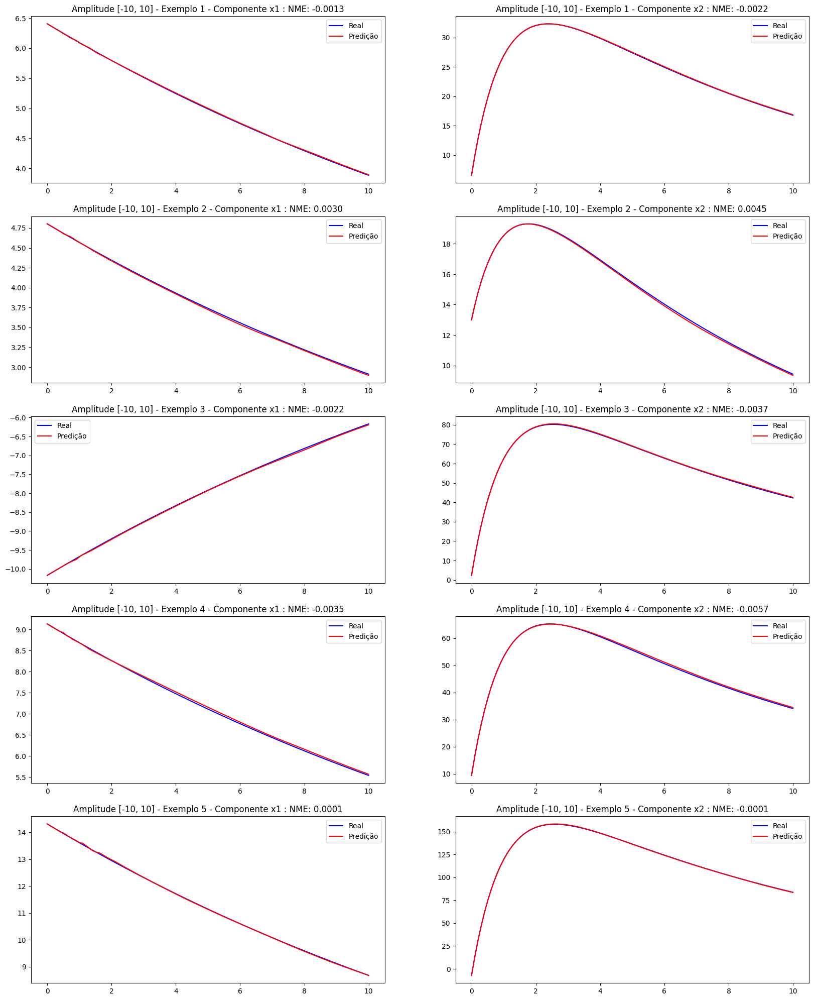

### Amplitude x0 em [-12, 12]

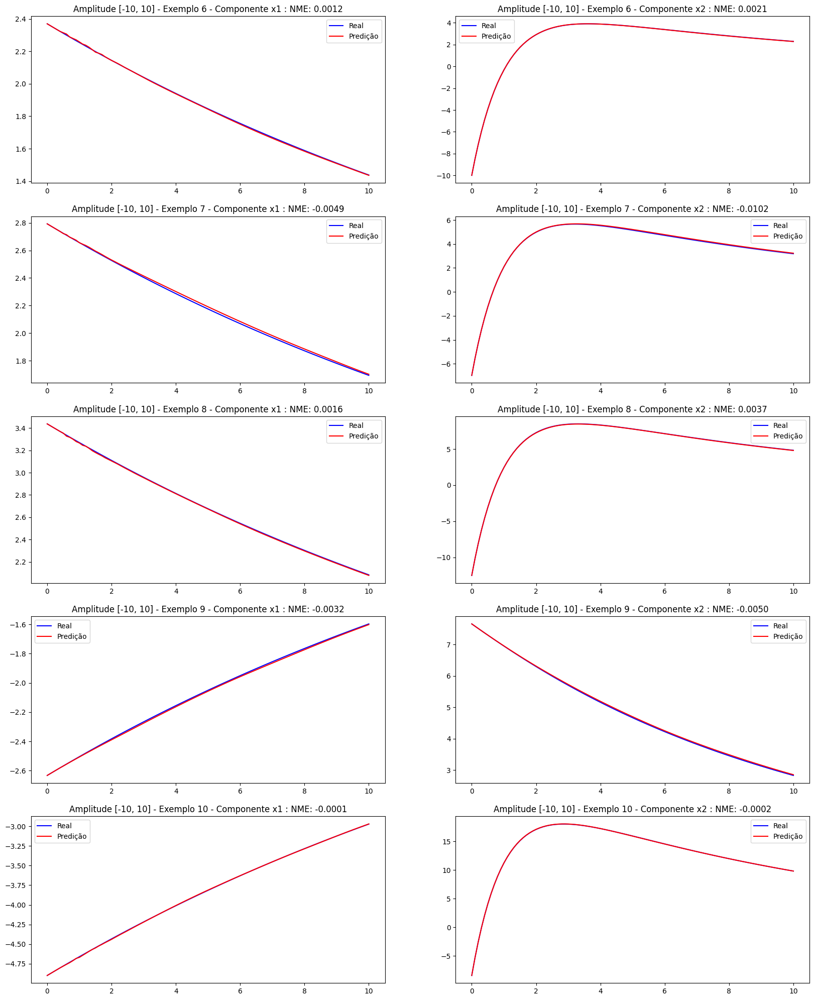

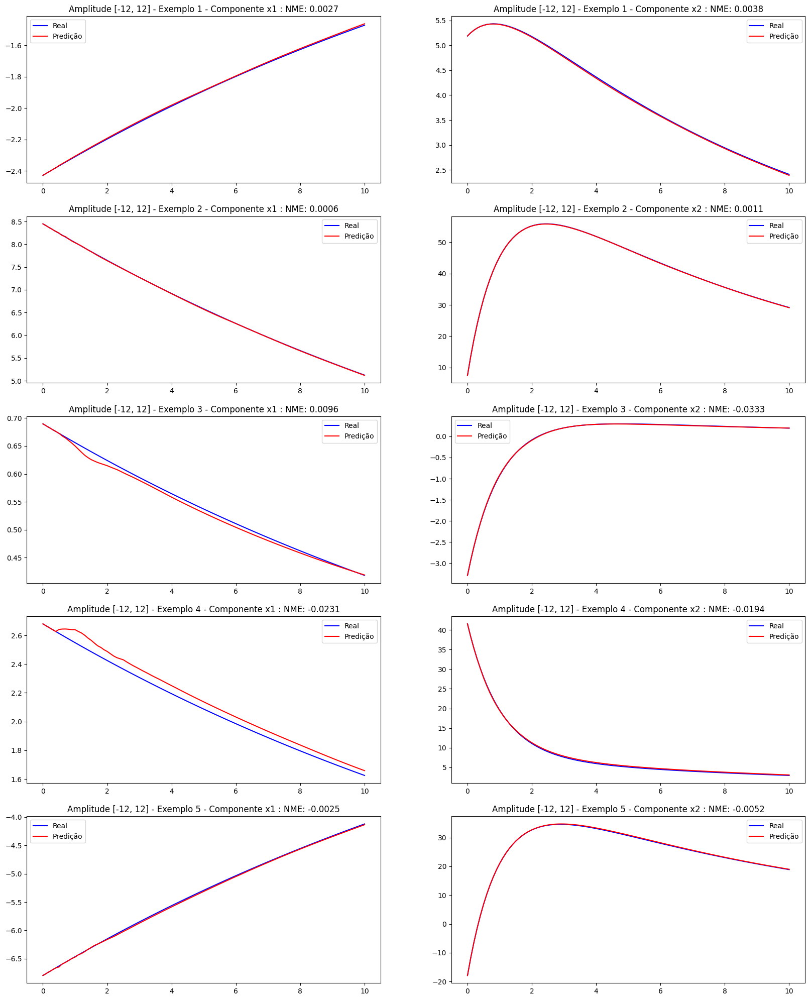

### Amplitude x0 em [-15, 15]

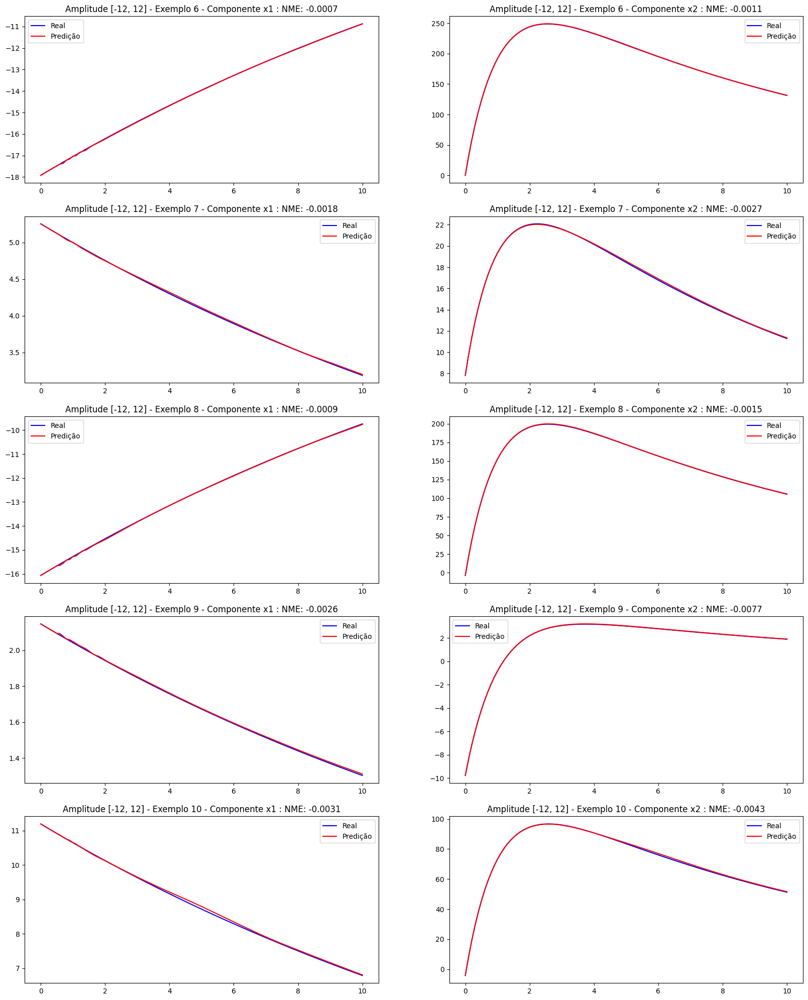

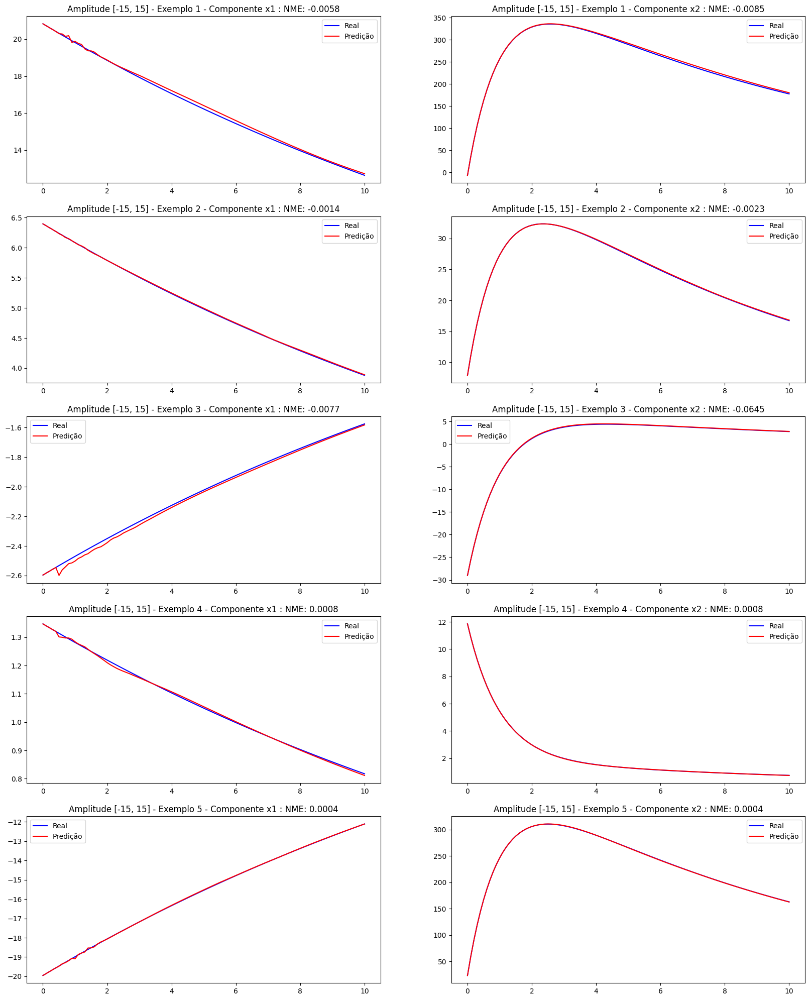

### Amplitude x0 em [-20, 20]

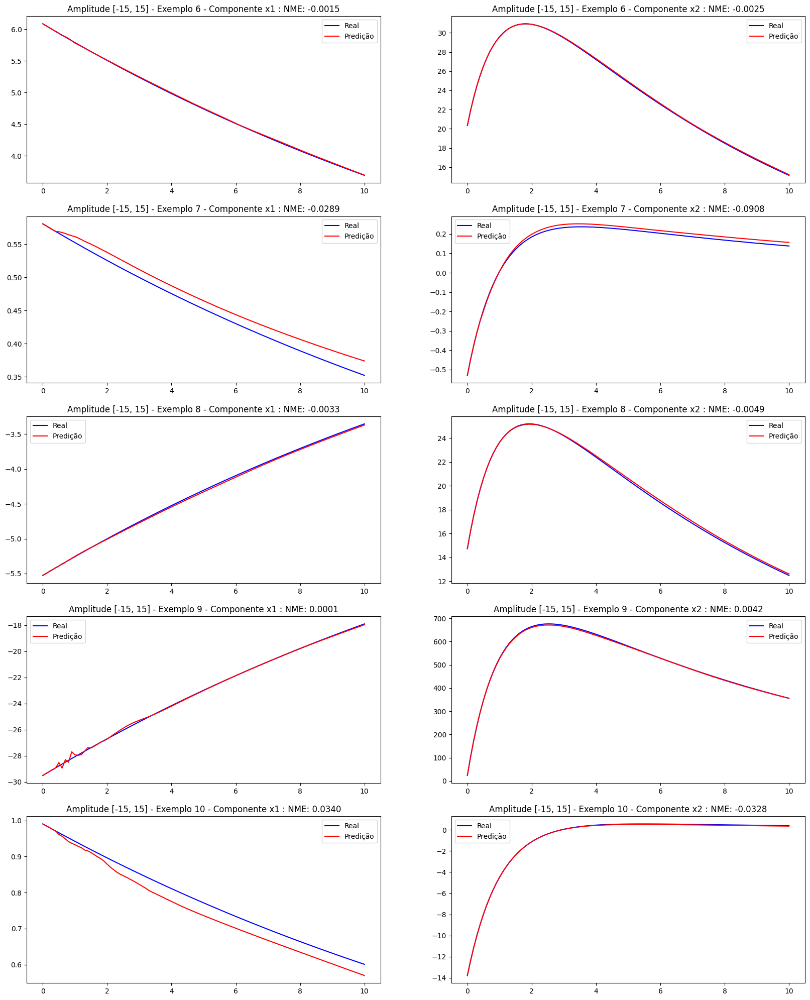

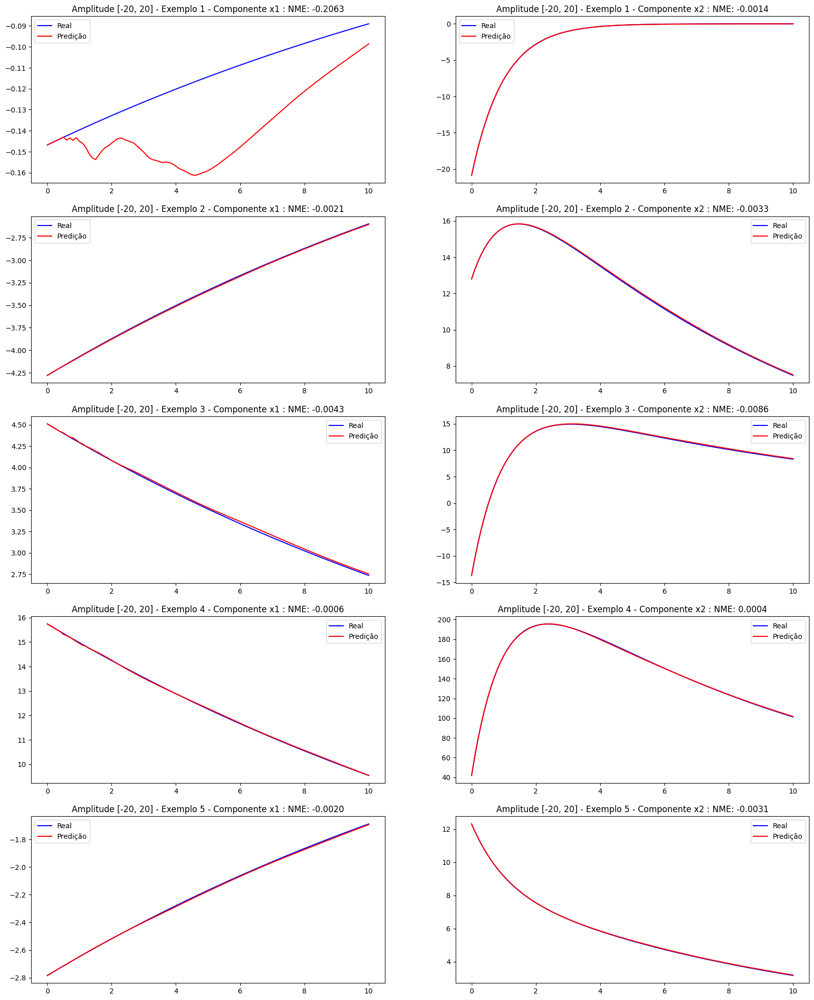

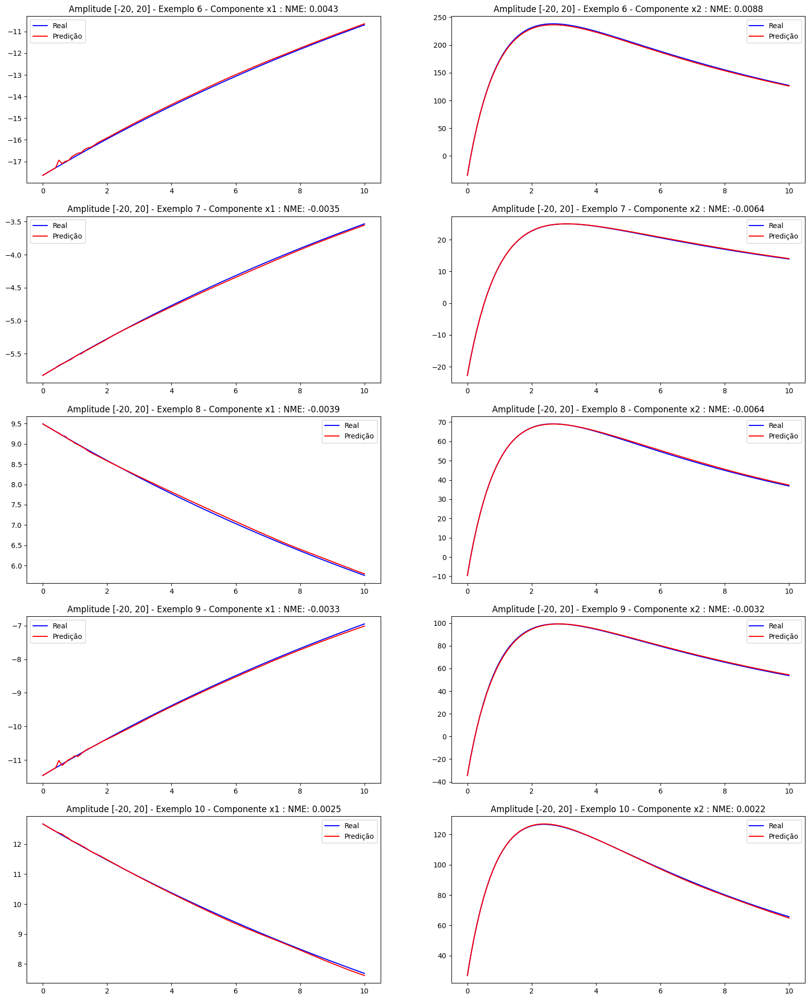

In [103]:
from matplotlib import pyplot as plt
from IPython.display import display, Markdown

N_GRAPHS = 10
N_GRAPHS_HALF = int(N_GRAPHS / 2)
COMPONENTS = ["x1", "x2"]

figure = plt.figure()
for bound in BOUNDS:
    display(Markdown(f"### Amplitude x0 em [-{bound}, {bound}]"))
    _, axis = plt.subplots(5, 2, figsize=(20, 25))
    idx_for_this_bound = bounds_idx[bound]
    for graph_index in range(0, N_GRAPHS_HALF):
        idx_i = idx_for_this_bound[graph_index]
        for j in range(2):
            nme = np.mean(x_validation[bound][idx_i, :, j] - predictions[bound]
                          [idx_i, :, j]) / np.mean(x_validation[bound][idx_i, :, j])
            axis[graph_index, j].plot(INTEGRATION_DOMAIN, x_validation[bound]
                                  [idx_i, :, j], "b", label="Real")
            axis[graph_index, j].plot(INTEGRATION_DOMAIN, predictions[bound]
                                  [idx_i, :, j], "r", label="Predição")
            axis[graph_index, j].legend()
            axis[graph_index, j].set_title(
                f"Amplitude [-{bound}, {bound}] - Exemplo {graph_index + 1} - Componente {COMPONENTS[j]} : NME: {nme:.4f}")
    plt.show()
    _, axis = plt.subplots(5, 2, figsize=(20, 25))
    for graph_index in range(N_GRAPHS_HALF, N_GRAPHS):
        idx_i = idx_for_this_bound[graph_index]
        for j in range(2):
            nme = np.mean(x_validation[bound][idx_i, :, j] - predictions[bound]
                          [idx_i, :, j]) / np.mean(x_validation[bound][idx_i, :, j])
            axis[graph_index - N_GRAPHS_HALF, j].plot(INTEGRATION_DOMAIN, x_validation[bound]
                                  [idx_i, :, j], "b", label="Real")
            axis[graph_index - N_GRAPHS_HALF, j].plot(INTEGRATION_DOMAIN, predictions[bound]
                                  [idx_i, :, j], "r", label="Predição")
            axis[graph_index - N_GRAPHS_HALF, j].legend()
            axis[graph_index - N_GRAPHS_HALF, j].set_title(
                f"Amplitude [-{bound}, {bound}] - Exemplo {graph_index + 1} - Componente {COMPONENTS[j]} : NME: {nme:.4f}")

### Scatter de NME para ambas as componentes

Apesar dos óbvios *outliers* que apresentam erros acentuados, a rede treinada parece apresentar um bom desempenho até em casos com amplitude inicial fora do intervalo treinado, no caso, intervalo $[-10, 10]$. Para verificar se isso se confirma em dados com um número maior de sistemas, segue abaixo um scatterplot de todos os sistemas preditos utilizando o modelo treinado, indicando o NME (*normalized mean error* ou erro médio normalizado) de cada um

### Amplitude x0 em [-1, 1]

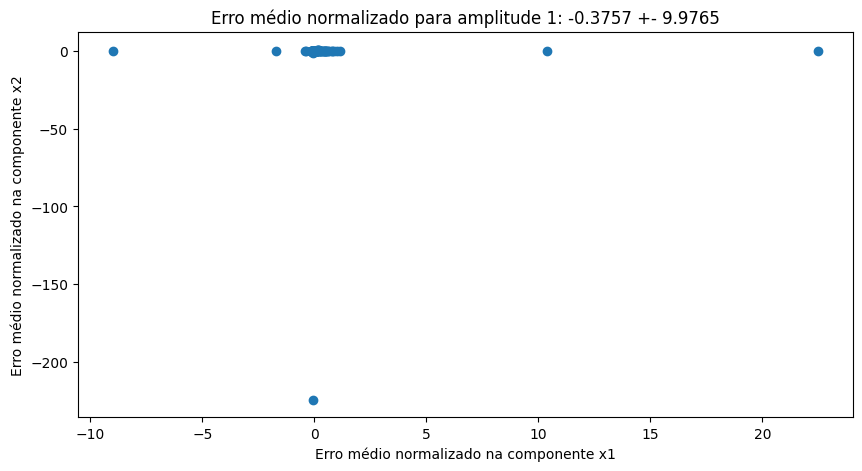

### Amplitude x0 em [-3, 3]

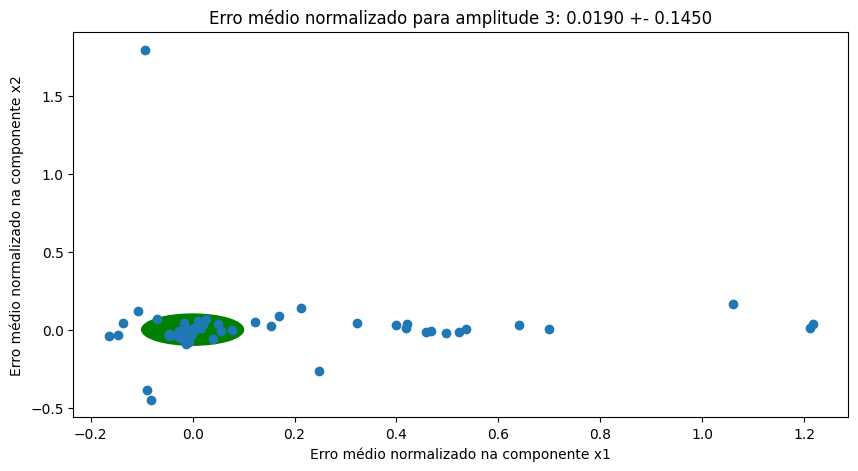

### Amplitude x0 em [-5, 5]

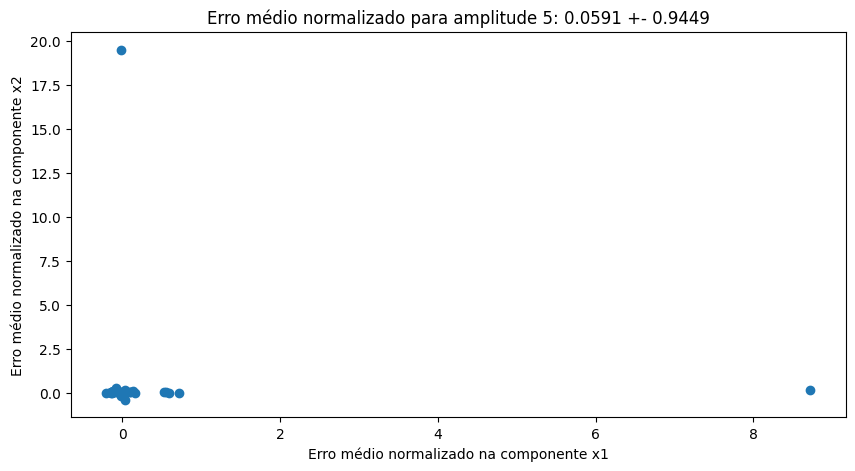

### Amplitude x0 em [-10, 10]

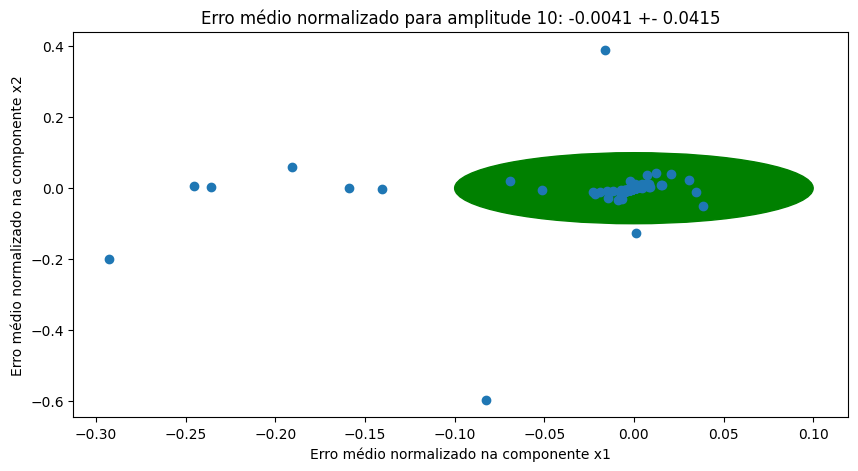

### Amplitude x0 em [-12, 12]

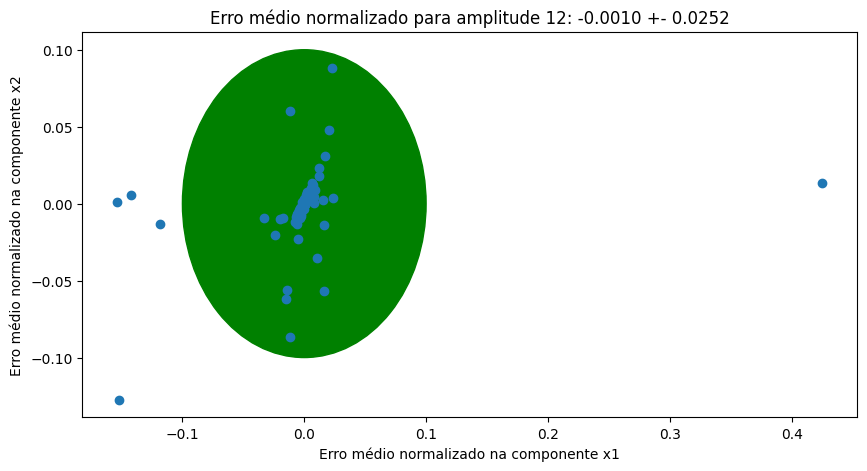

### Amplitude x0 em [-15, 15]

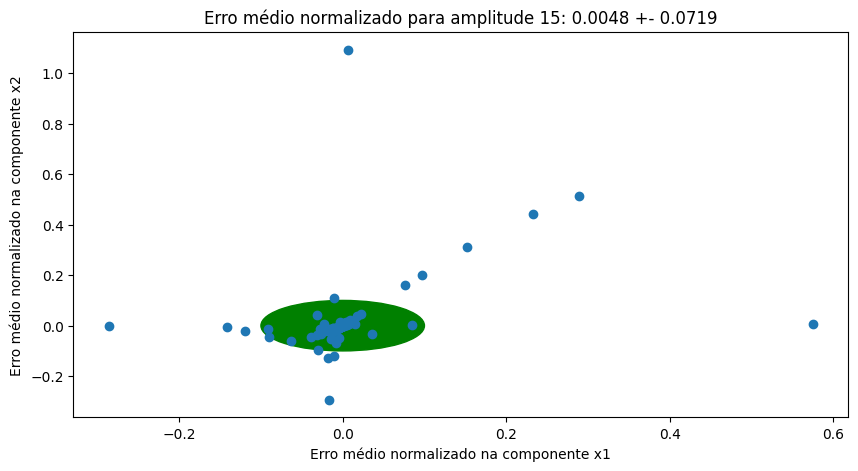

### Amplitude x0 em [-20, 20]

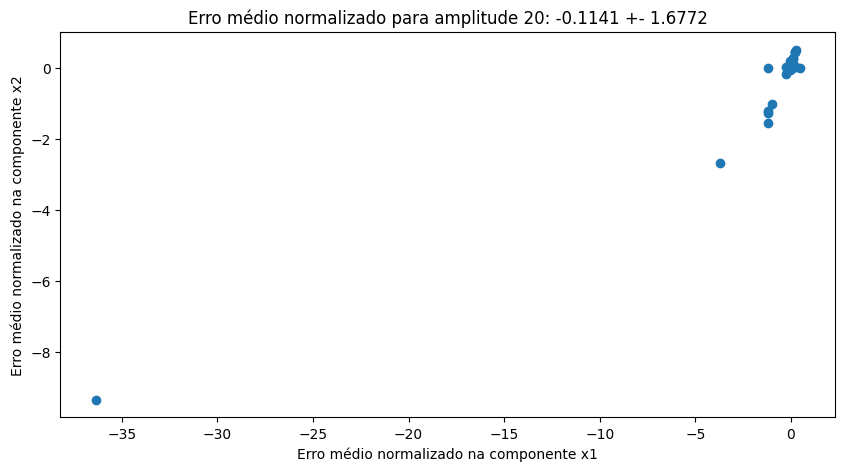

In [145]:
from matplotlib import pyplot as plt
from matplotlib.pyplot import Circle
from IPython.display import display, Markdown
    
nme = dict()
for bound in BOUNDS:
  nme[bound] = np.zeros((N_TEST_EXAMPLES, 2))
  for system_idx in range(N_TEST_EXAMPLES):
    for component_idx in range(2):
      nme[bound][system_idx, component_idx] = np.mean( # Média de (Real - Predição)
        x_validation[bound][system_idx, 5:, component_idx] - # Real
        predictions[bound][system_idx, 5:, component_idx] # Predição
      ) / np.mean(x_validation[bound][system_idx, :, component_idx]) # Normalizada pela média de real

for bound in BOUNDS:
  display(Markdown(f"### Amplitude x0 em [-{bound}, {bound}]"))
  circle = Circle((0, 0), 0.1, color='g')
  plt.figure(figsize=(10,5))
  plt.gca().add_patch(circle)
  plt.scatter(nme[bound][:, 0], nme[bound][:, 1])
  plt.xlabel('Erro médio normalizado na componente x1')
  plt.ylabel('Erro médio normalizado na componente x2')
  plt.title(f'Erro médio normalizado para amplitude {bound}: {np.mean(nme[bound]):.4f} +- {np.std(nme[bound]):.4f}')
  plt.show()

A visualização fica muito prejudicada pela presença de alguns sistemas que falham em atingir convergência. O círculo verde presente em alguns gráficos contém um raio de 0.1, indicando todas as predições que obteram um erro médio percentual inferior ou igual a 10%.

### Soma dos NME para cada amplitude e sua distribuição

Para compreender melhor a distribuição de erros, iremos utilizar escala logarítmica e verificar quantos exemplos falharam em atingir uma convergência aceitável. Nesse caso, iremos somar os erros para as duas componentes.

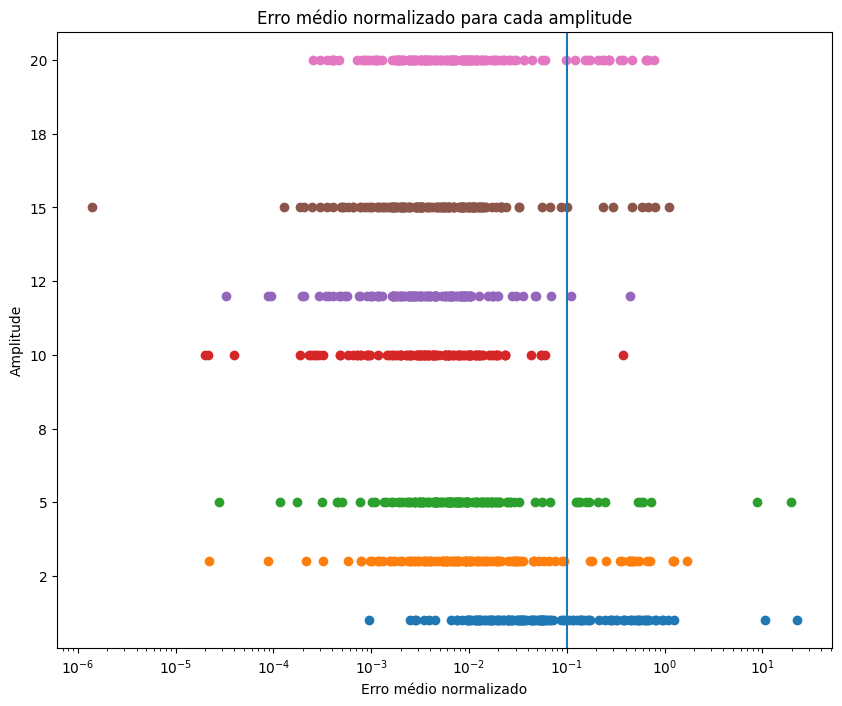

In [171]:
from matplotlib.ticker import FormatStrFormatter

plt.figure(figsize=(10,8))
for bound in BOUNDS:
    plt.scatter(np.sum(nme[bound], axis=1), np.full_like(np.sum(nme[bound], axis=1), bound))
plt.xlabel('Erro médio normalizado')
plt.ylabel('Amplitude')
plt.title('Erro médio normalizado para cada amplitude')
plt.xscale('log')
plt.axvline(0.1)
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.0f'))
plt.show()

De forma surpreendente, condições iniciais na amplitude mais baixa (1) apresentaram um resultado muito pior do que amplitudes mais altas, incluso aquelas que não estavam presentes no conjunto de treinamento (12, 15 e 20).

Mais especificamente, se utilizarmos o valor 0.1 como *threshold*:

### [Dataframe]: número de falhas para cada amplitude

In [174]:
diverging = pd.DataFrame(columns=['Amplitude', 'Número de falhas'])
for idx, bound in enumerate(BOUNDS):
    nme_x1x2_sum: np.ndarray = np.sum(nme[bound], axis=1)
    within_threshold = nme_x1x2_sum <= 0.1
    diverging.loc[idx] = [bound, np.count_nonzero(within_threshold == False)]
display(diverging)

,Amplitude,Número de falhas
0,1,43
1,3,19
2,5,13
3,10,1
4,12,2
5,15,7
6,20,17


Então embora a rede treinada seja capaz de generalizar para amplitudes não presentes no conjunto de treinamento (com menor precisão, naturalmente), a mesma não foi capaz de obter um desempenho satisfatório para uma amplitude menor.

No entanto, é importante lembrar que esses exemplos são gerados utilizando um gerador de números aleatórios. E o resultado pode variar de caso para caso, por isso fixamos uma única *seed* para realizar as predições. Na próxima sessão, iremos repetir todo esse processo com uma outra *seed*, e verificar se o resultado é parecido.

# [Alterando *seed*] Testando modelo treinado

O processo será semelhante ao da sessão anterior, então não repetirei as explicações já dadas. Nessa seção, utilizaremos a *seed* 666 (por nenhum motivo em específico).

In [ ]:
import numpy as np
from scipy.integrate import odeint

N_TEST_EXAMPLES = 256  # Teste para cada amplitude, nem todos serão plotados em gráfico
BOUNDS = [1, 3, 5, 10, 12, 15, 20]  # Diferentes amplitudes utilizadas

np.random.seed(666)

x_validation = dict()
for bound in BOUNDS:
    x0_validation = random_with_scale((N_TEST_EXAMPLES, 2), bound)
    x_validation[bound] = np.asarray(
        [odeint(simple_spectrum, x0_j, INTEGRATION_DOMAIN) for x0_j in x0_validation])

predictions = dict()
for k, v in x_validation.items():
    predictions[k] = np.zeros_like(v)
    # Primeiros 5 valores, visto que a rede foi treinada para receber entradas com sequência de 5 valores
    predictions[k][:, 0:5, :] = v[:, 0:5, :]
    for j in range(5, len(INTEGRATION_DOMAIN)):
        predictions[k][:, j, :] = model.predict(
            predictions[k][:, j - 5:j, :])

[OPCIONAL] (salvando dados de predição)

In [176]:
import h5py

with h5py.File(f"predictions_result/model_prediction_seed_666.h5", "w") as f:
  for k, v in predictions.items():
    f.create_dataset(f"{k}", data=v)

[OPCIONAL] (carregando dados de predição)

In [ ]:

predictions_i = dict()
with h5py.File(f"predictions_result/model_prediction_seed_666.h5", "r") as f:
  for k, v in f.items():
    predictions_i[int(k)] = np.asarray(v)

In [177]:
idx_permutation = np.arange(0, 256)
np.random.shuffle(idx_permutation)
bounds_idx = dict()
for i, bound in enumerate(BOUNDS):
    bounds_idx[bound] = idx_permutation[10 * i: 10 * i + 10]

## Gráficos

### Componentes x Tempo

Utilizando apenas os índices aleatórios gerados via permutação

### Amplitude x0 em [-1, 1]

<Figure size 640x480 with 0 Axes>

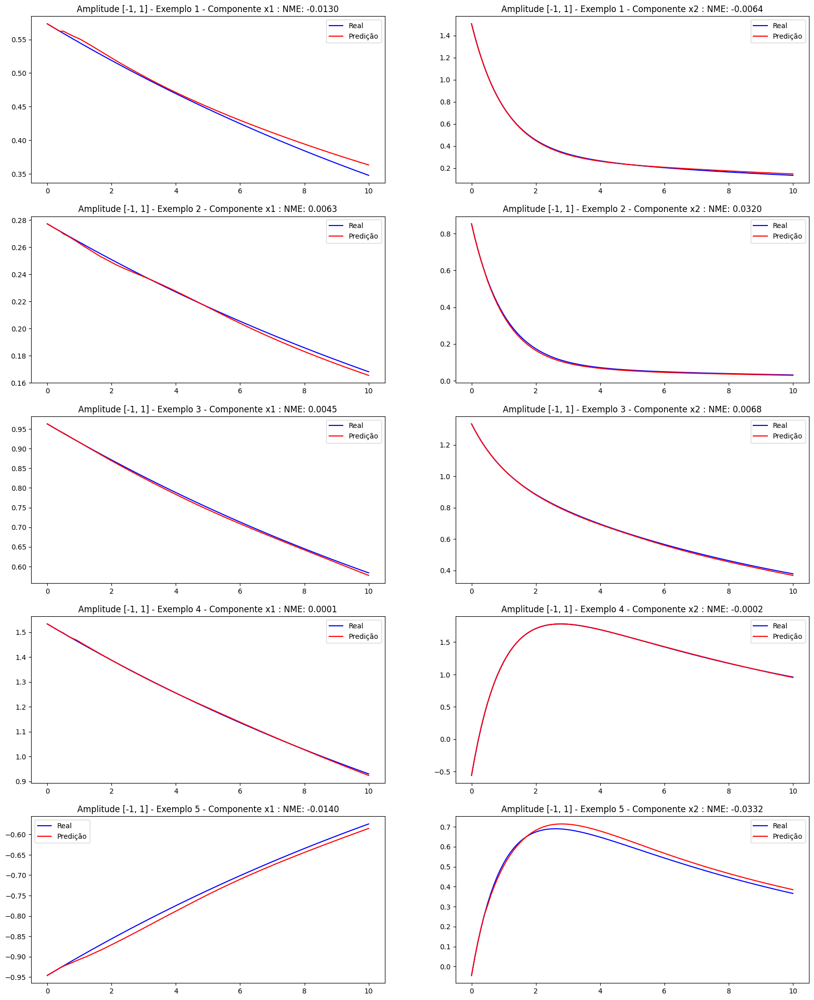

### Amplitude x0 em [-3, 3]

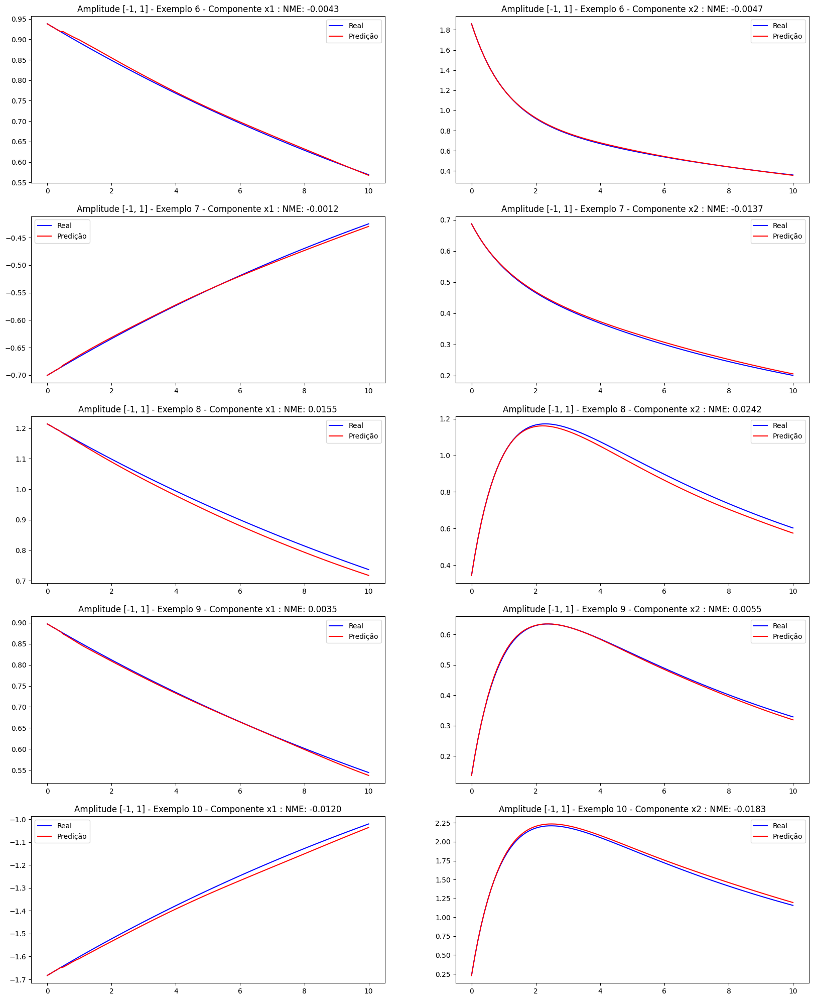

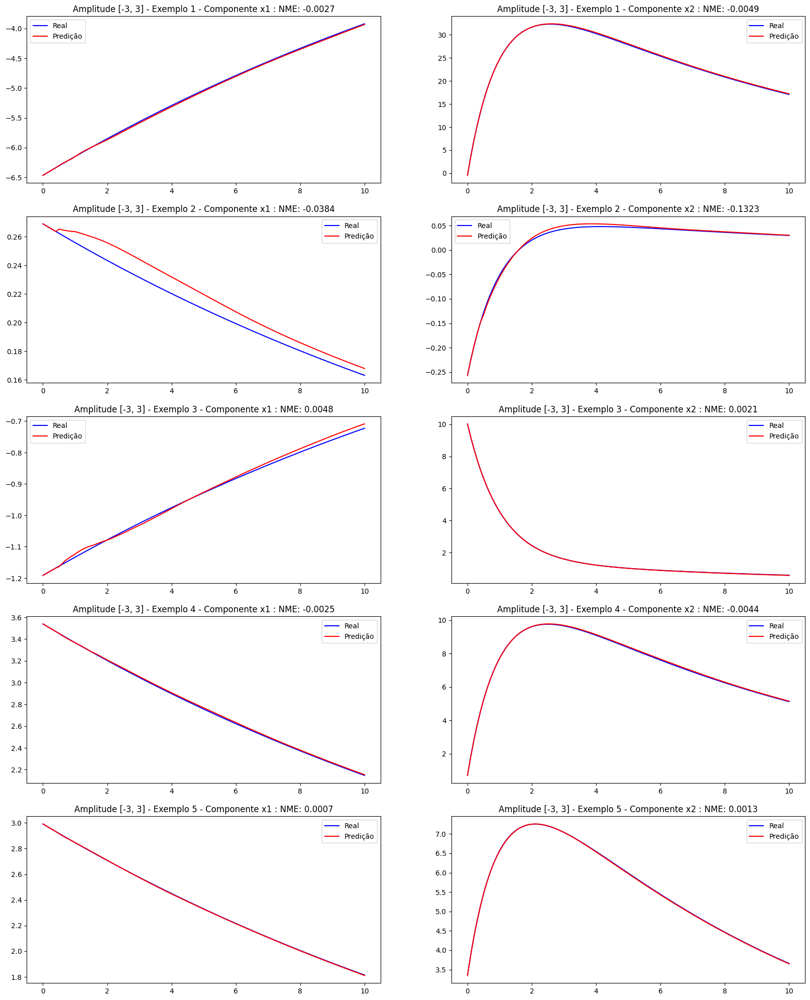

### Amplitude x0 em [-5, 5]

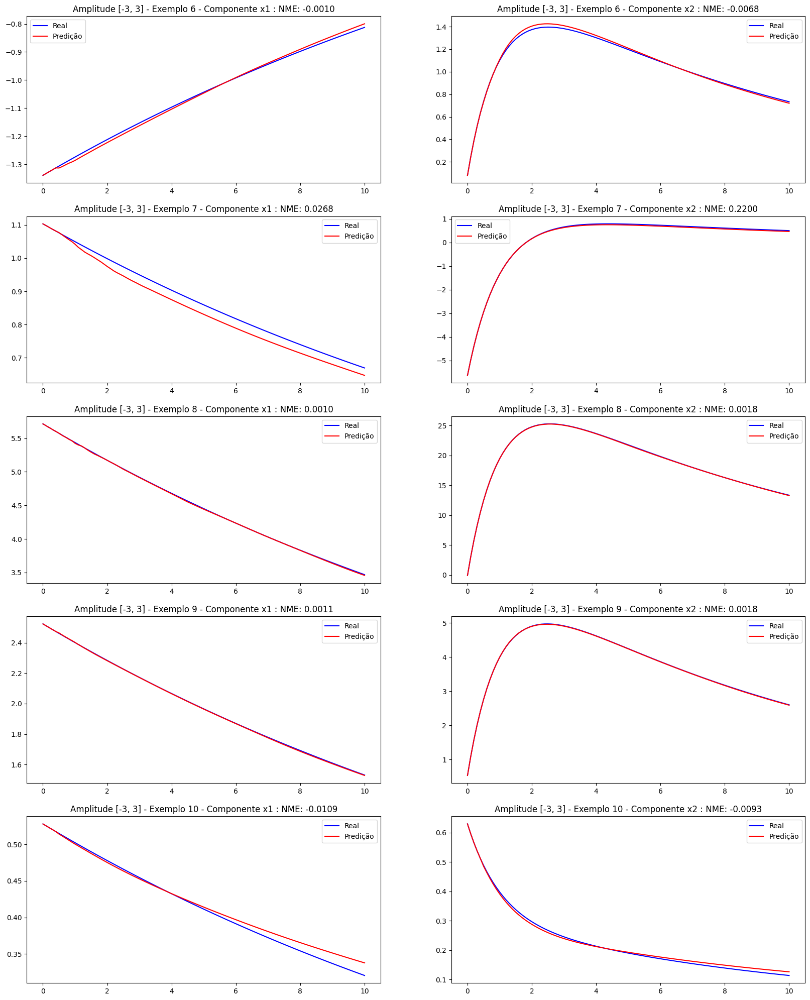

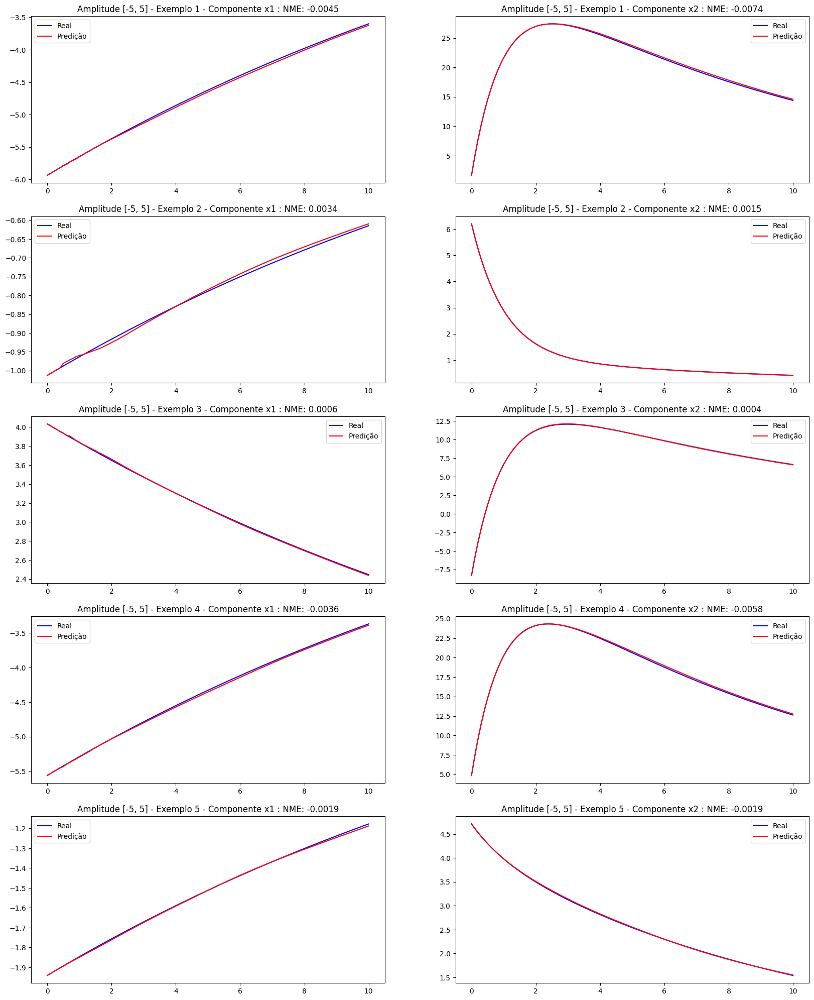

### Amplitude x0 em [-10, 10]

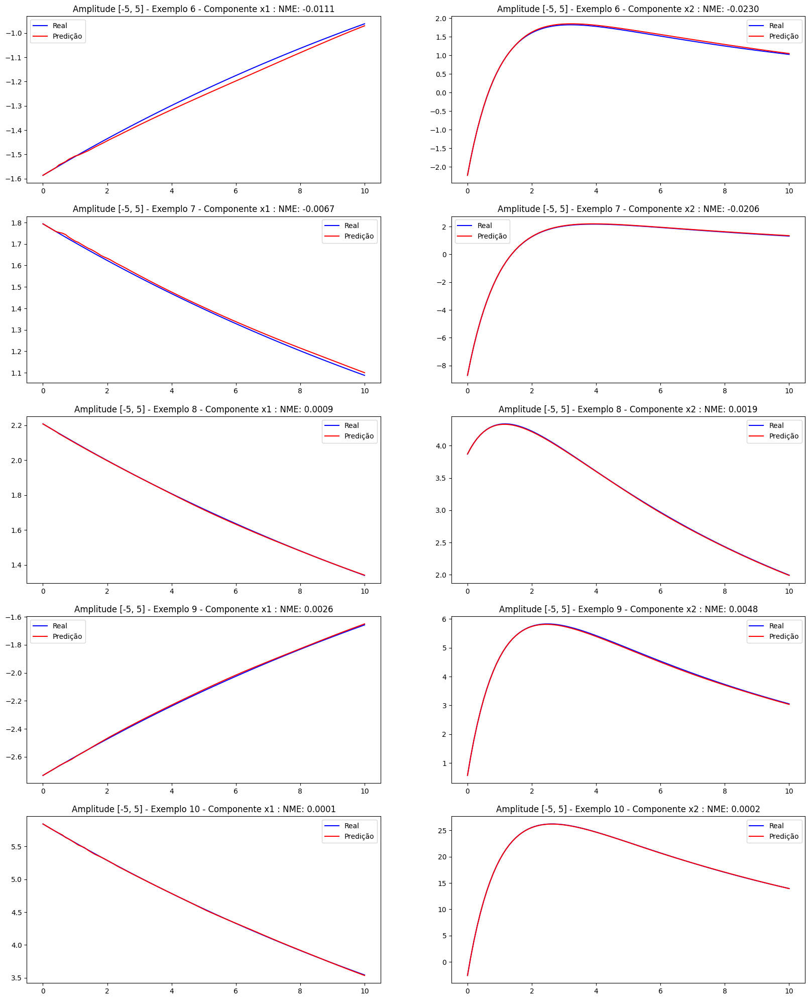

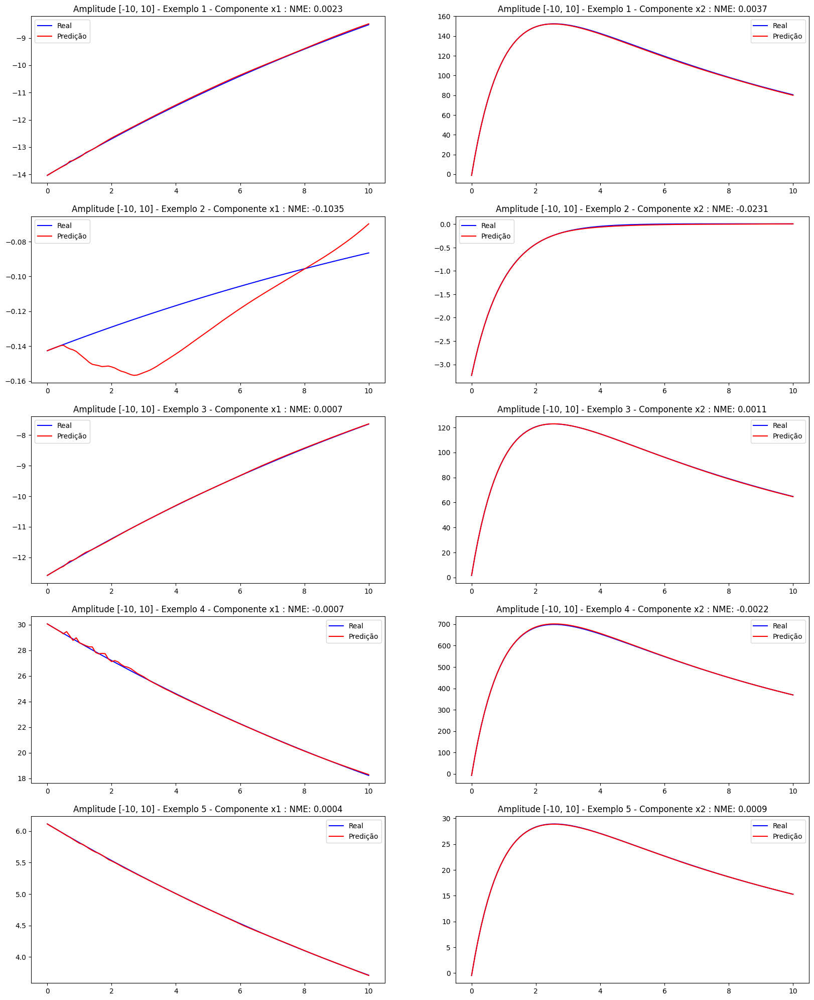

### Amplitude x0 em [-12, 12]

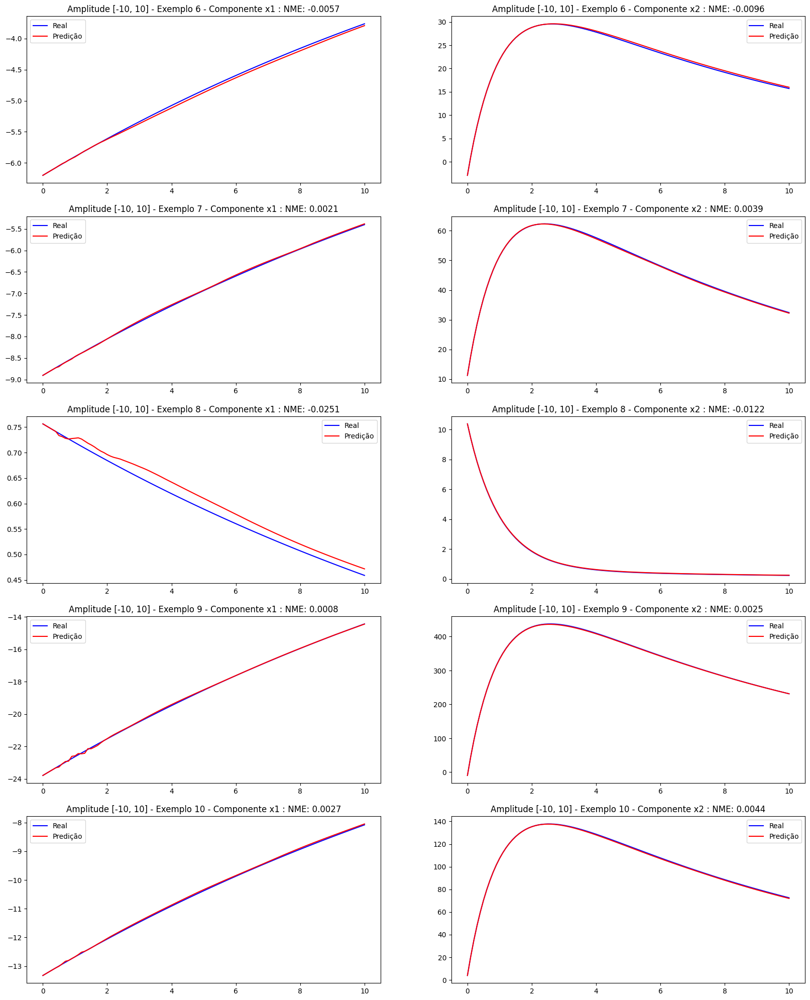

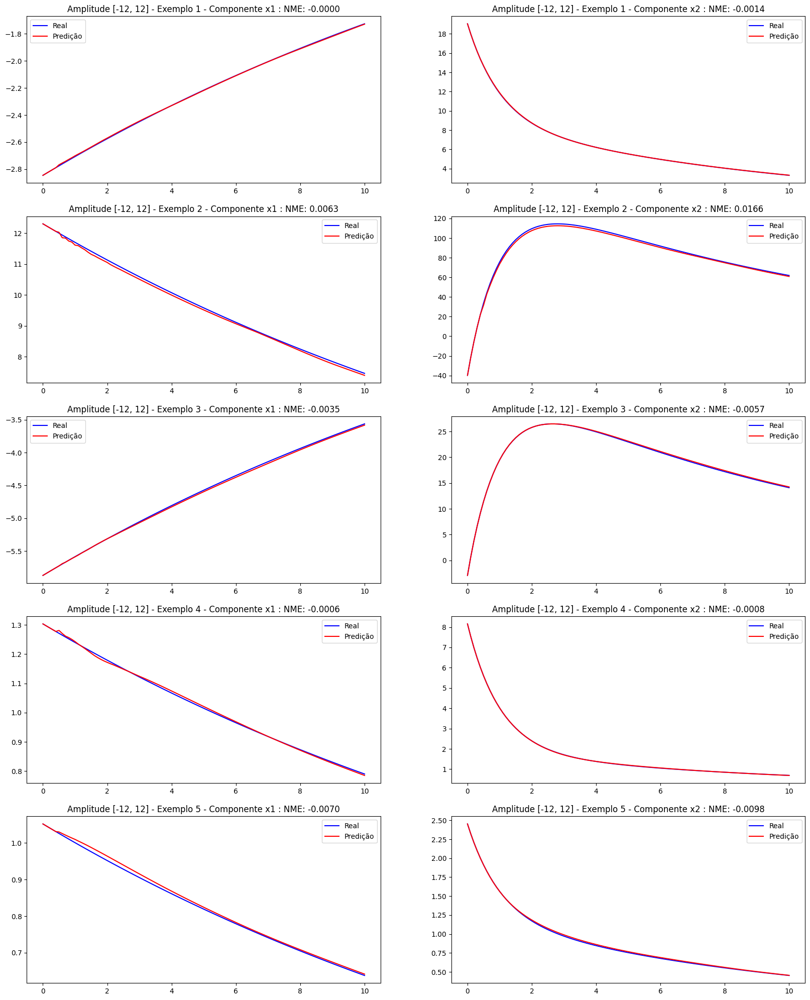

### Amplitude x0 em [-15, 15]

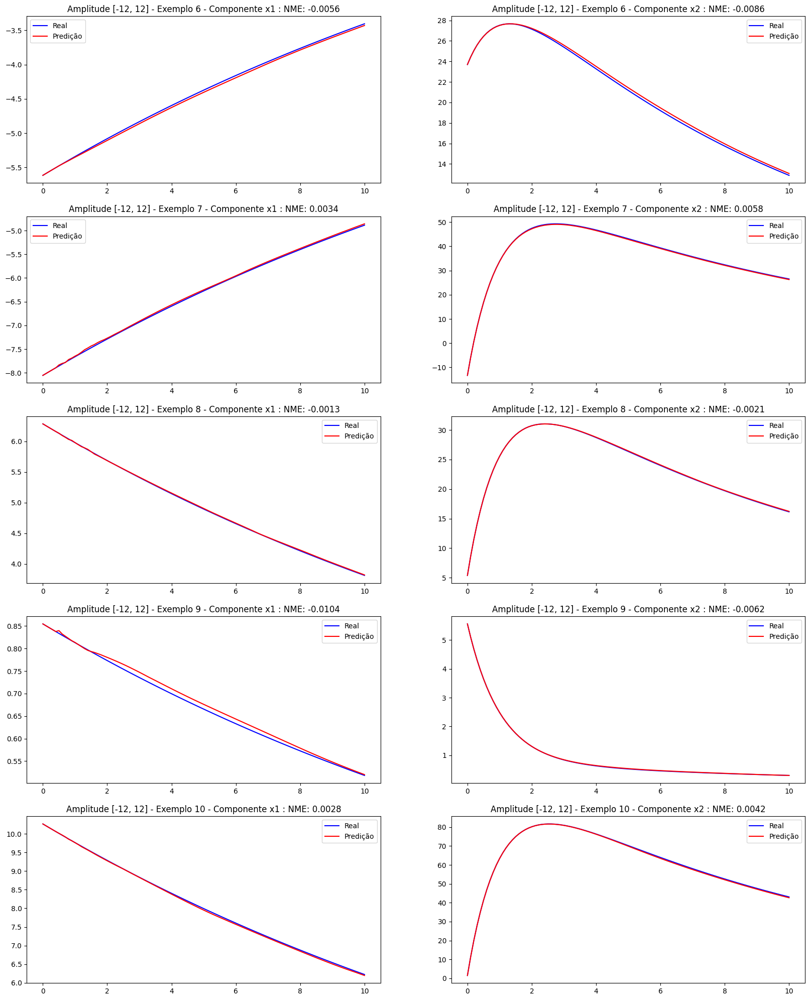

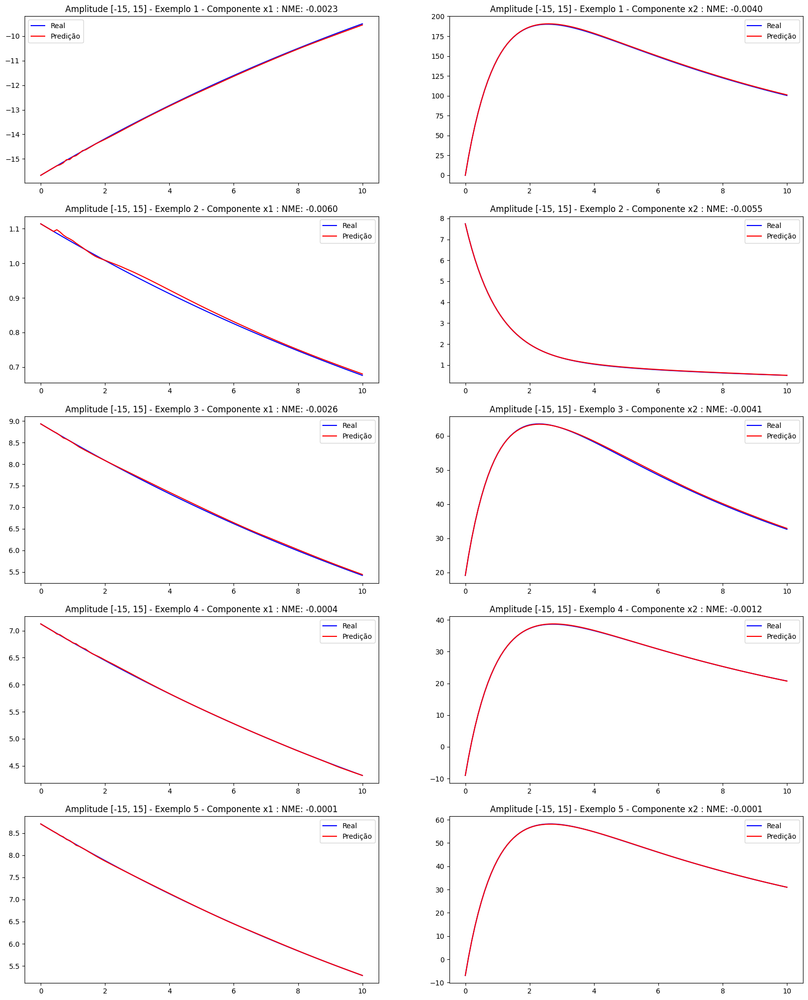

### Amplitude x0 em [-20, 20]

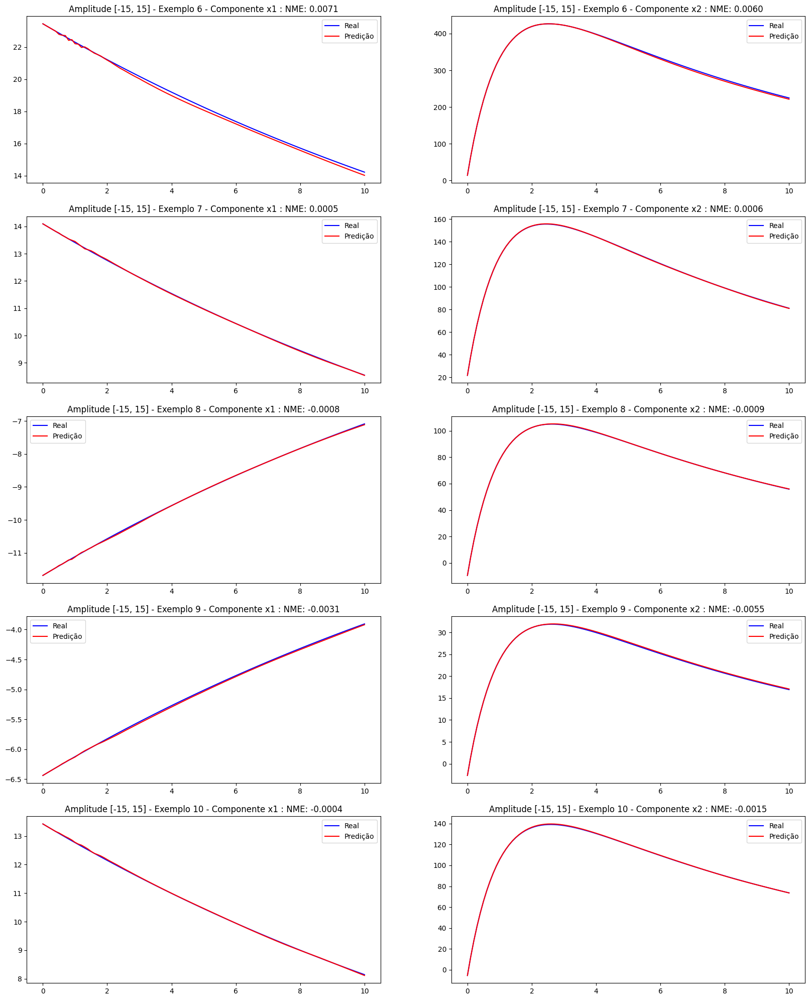

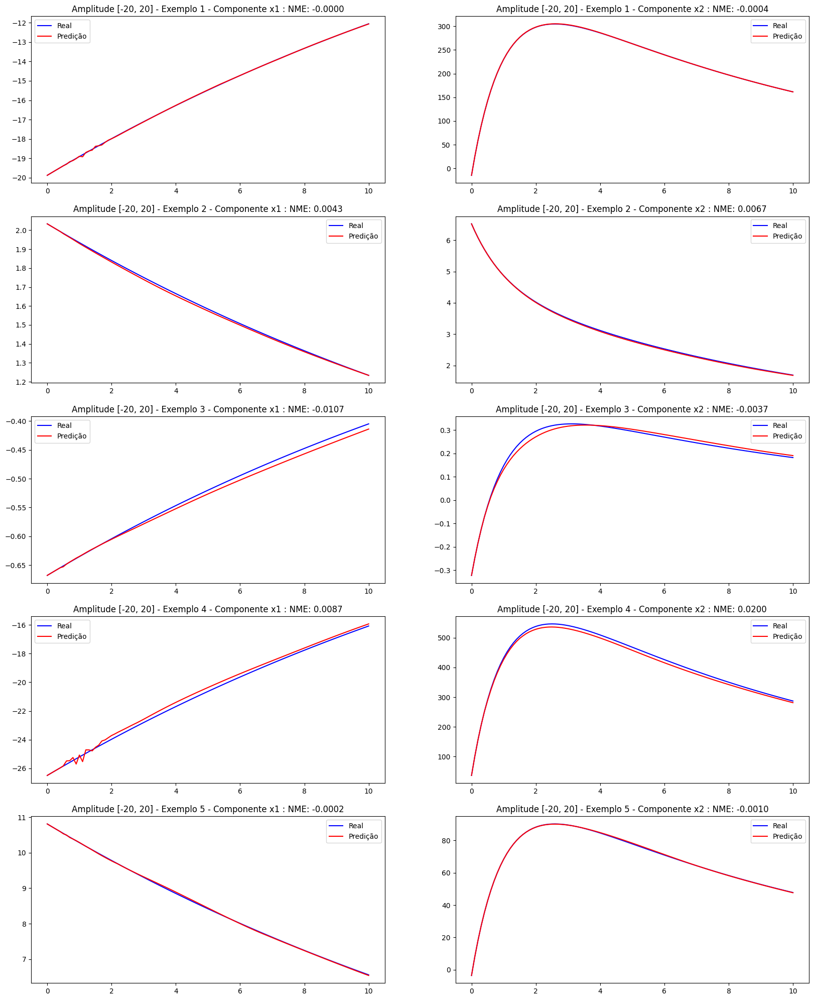

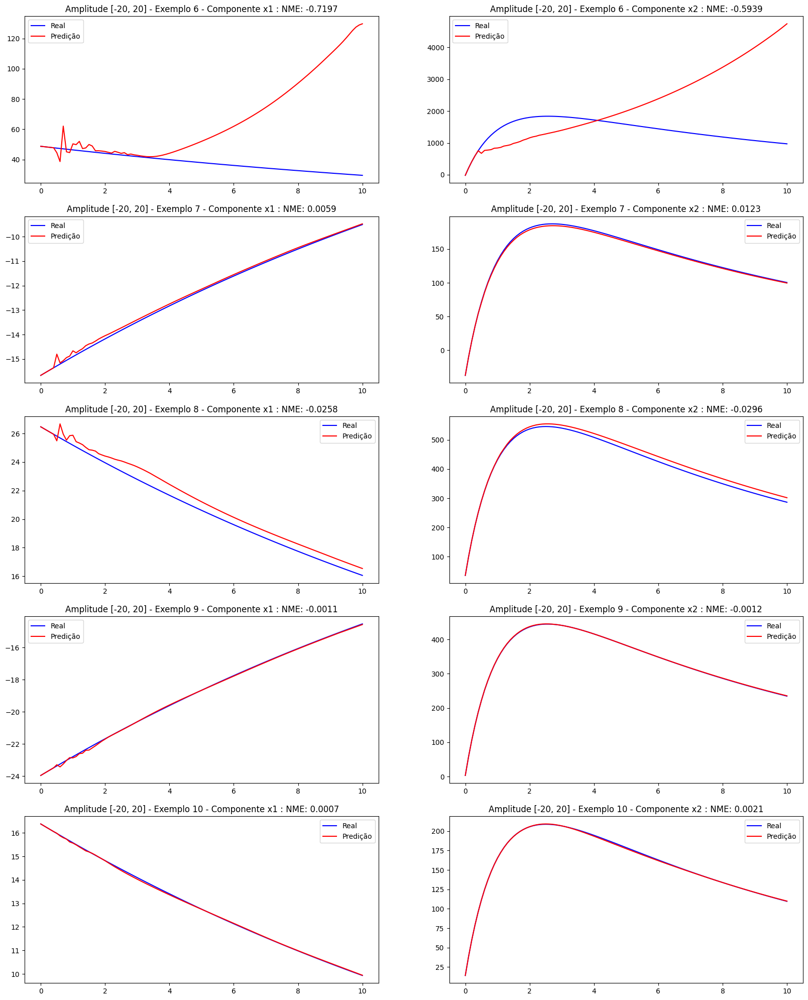

In [178]:
from matplotlib import pyplot as plt
from IPython.display import display, Markdown

N_GRAPHS = 10
N_GRAPHS_HALF = int(N_GRAPHS / 2)
COMPONENTS = ["x1", "x2"]

figure = plt.figure()
for bound in BOUNDS:
    display(Markdown(f"### Amplitude x0 em [-{bound}, {bound}]"))
    _, axis = plt.subplots(5, 2, figsize=(20, 25))
    idx_for_this_bound = bounds_idx[bound]
    for graph_index in range(0, N_GRAPHS_HALF):
        idx_i = idx_for_this_bound[graph_index]
        for j in range(2):
            nme = np.mean(x_validation[bound][idx_i, :, j] - predictions[bound]
                          [idx_i, :, j]) / np.mean(x_validation[bound][idx_i, :, j])
            axis[graph_index, j].plot(INTEGRATION_DOMAIN, x_validation[bound]
                                  [idx_i, :, j], "b", label="Real")
            axis[graph_index, j].plot(INTEGRATION_DOMAIN, predictions[bound]
                                  [idx_i, :, j], "r", label="Predição")
            axis[graph_index, j].legend()
            axis[graph_index, j].set_title(
                f"Amplitude [-{bound}, {bound}] - Exemplo {graph_index + 1} - Componente {COMPONENTS[j]} : NME: {nme:.4f}")
    plt.show()
    _, axis = plt.subplots(5, 2, figsize=(20, 25))
    for graph_index in range(N_GRAPHS_HALF, N_GRAPHS):
        idx_i = idx_for_this_bound[graph_index]
        for j in range(2):
            nme = np.mean(x_validation[bound][idx_i, :, j] - predictions[bound]
                          [idx_i, :, j]) / np.mean(x_validation[bound][idx_i, :, j])
            axis[graph_index - N_GRAPHS_HALF, j].plot(INTEGRATION_DOMAIN, x_validation[bound]
                                  [idx_i, :, j], "b", label="Real")
            axis[graph_index - N_GRAPHS_HALF, j].plot(INTEGRATION_DOMAIN, predictions[bound]
                                  [idx_i, :, j], "r", label="Predição")
            axis[graph_index - N_GRAPHS_HALF, j].legend()
            axis[graph_index - N_GRAPHS_HALF, j].set_title(
                f"Amplitude [-{bound}, {bound}] - Exemplo {graph_index + 1} - Componente {COMPONENTS[j]} : NME: {nme:.4f}")

### Scatter de NME para ambas as componentes

### Amplitude x0 em [-1, 1]

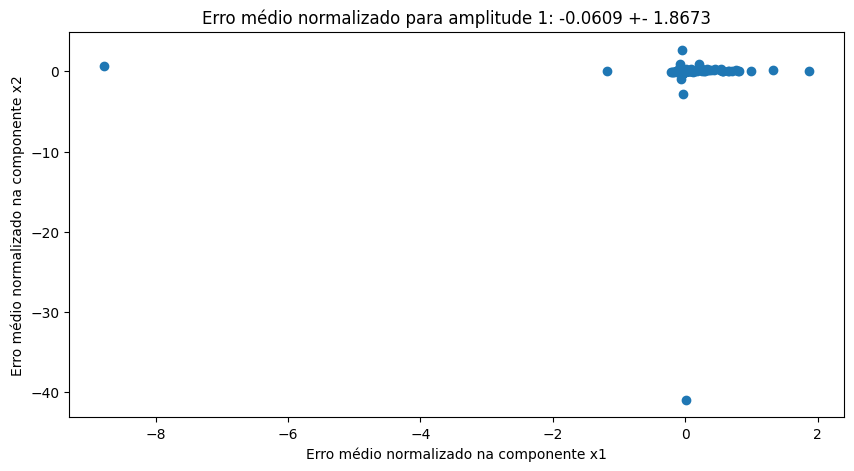

### Amplitude x0 em [-3, 3]

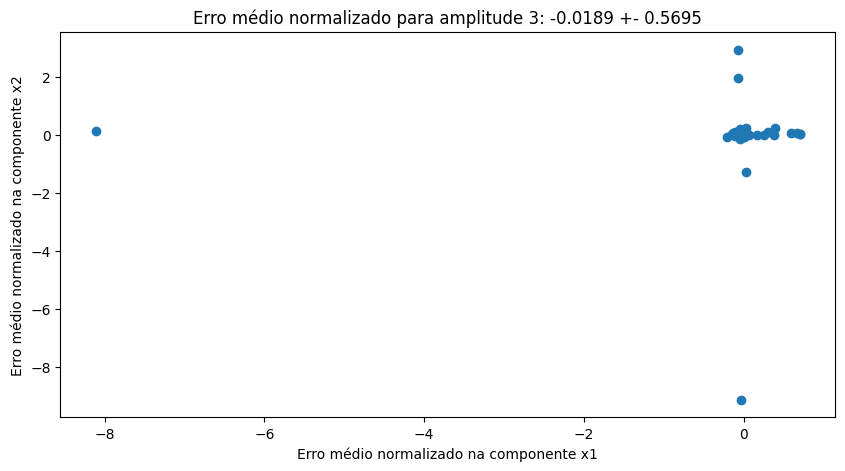

### Amplitude x0 em [-5, 5]

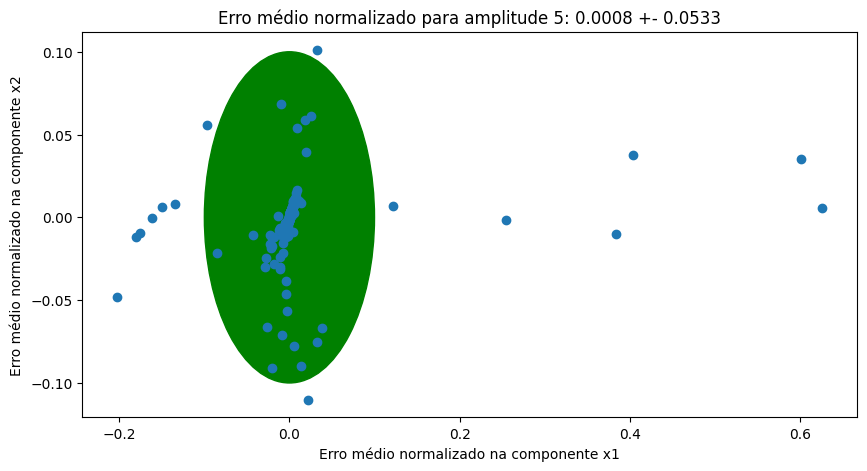

### Amplitude x0 em [-10, 10]

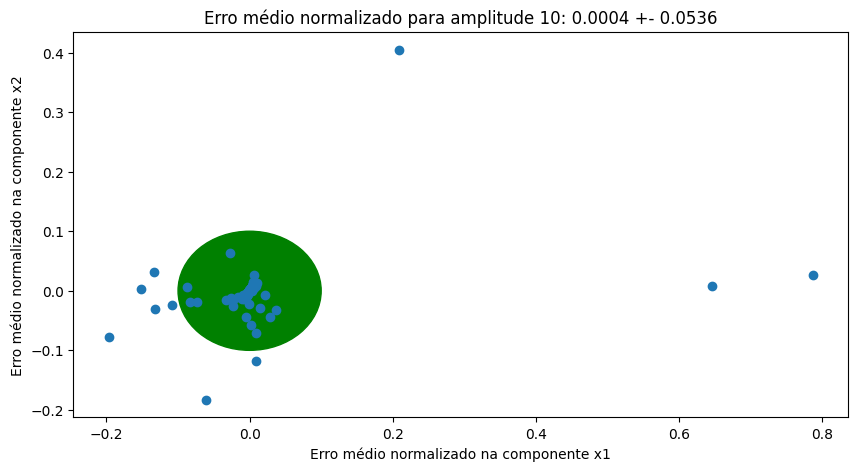

### Amplitude x0 em [-12, 12]

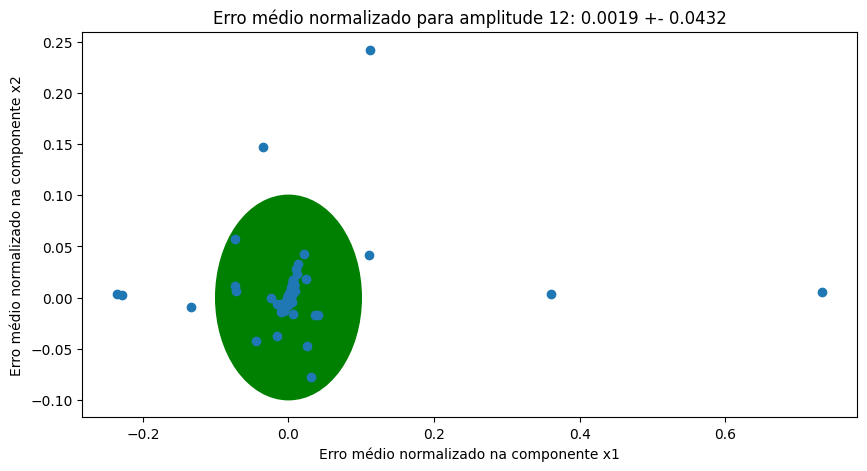

### Amplitude x0 em [-15, 15]

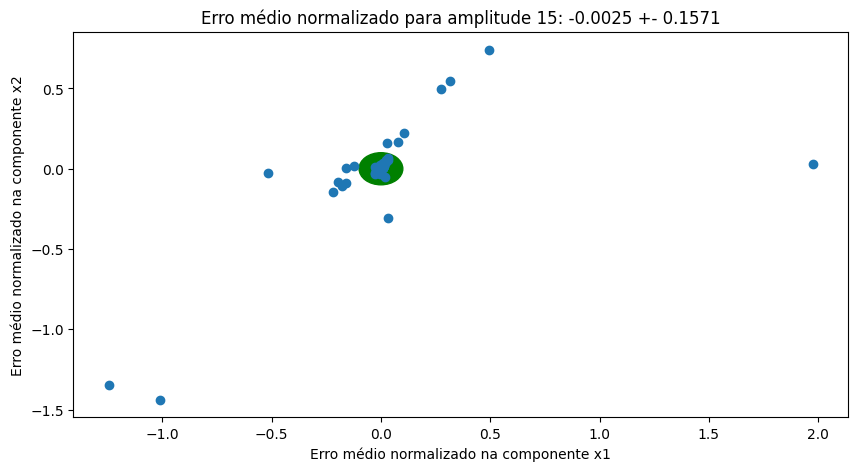

### Amplitude x0 em [-20, 20]

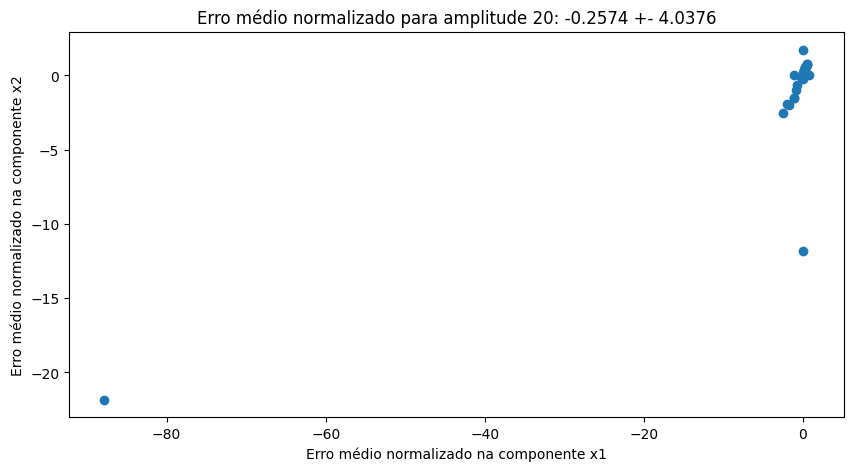

In [179]:
from matplotlib import pyplot as plt
from matplotlib.pyplot import Circle
from IPython.display import display, Markdown
    
nme = dict()
for bound in BOUNDS:
  nme[bound] = np.zeros((N_TEST_EXAMPLES, 2))
  for system_idx in range(N_TEST_EXAMPLES):
    for component_idx in range(2):
      nme[bound][system_idx, component_idx] = np.mean( # Média de (Real - Predição)
        x_validation[bound][system_idx, 5:, component_idx] - # Real
        predictions[bound][system_idx, 5:, component_idx] # Predição
      ) / np.mean(x_validation[bound][system_idx, :, component_idx]) # Normalizada pela média de real

for bound in BOUNDS:
  display(Markdown(f"### Amplitude x0 em [-{bound}, {bound}]"))
  circle = Circle((0, 0), 0.1, color='g')
  plt.figure(figsize=(10,5))
  plt.gca().add_patch(circle)
  plt.scatter(nme[bound][:, 0], nme[bound][:, 1])
  plt.xlabel('Erro médio normalizado na componente x1')
  plt.ylabel('Erro médio normalizado na componente x2')
  plt.title(f'Erro médio normalizado para amplitude {bound}: {np.mean(nme[bound]):.4f} +- {np.std(nme[bound]):.4f}')
  plt.show()

### Soma dos NME para cada amplitude e sua distribuição

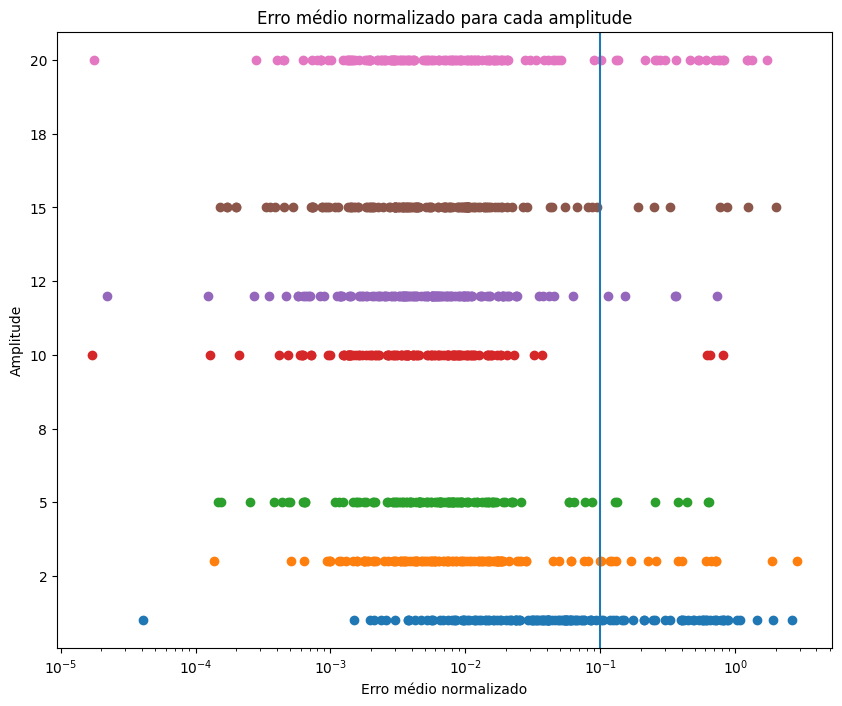

In [180]:
from matplotlib.ticker import FormatStrFormatter

plt.figure(figsize=(10, 8))
for bound in BOUNDS:
    plt.scatter(np.sum(nme[bound], axis=1), np.full_like(
        np.sum(nme[bound], axis=1), bound))
plt.xlabel('Erro médio normalizado')
plt.ylabel('Amplitude')
plt.title('Erro médio normalizado para cada amplitude')
plt.xscale('log')
plt.axvline(0.1)
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.0f'))
plt.show()

### [Dataframe]: número de falhas para cada amplitude

In [181]:
diverging = pd.DataFrame(columns=['Amplitude', 'Número de falhas'])
for idx, bound in enumerate(BOUNDS):
    nme_x1x2_sum: np.ndarray = np.sum(nme[bound], axis=1)
    within_threshold = nme_x1x2_sum <= 0.1
    diverging.loc[idx] = [bound, np.count_nonzero(within_threshold == False)]
display(diverging)

,Amplitude,Número de falhas
0,1,43
1,3,17
2,5,7
3,10,3
4,12,5
5,15,7
6,20,22


Conclusão: o comportamento observado na seção anterior se repetiu, e a rede apresenta graves dificuldades de lidar com baixas amplitudes.

# Ideias para próximos experimentos

- Ao realizar os *trials* do Optuna, punir redes com maior número de células LSTM, visando produzir redes com maior capacidade de generalização.
- Realizar *trials* com maior número de *epochs*, para tentar prever a situação que ocorreu no treinamento da rede modelada nesse *notebook*, isto é, presença de picos inesperados e aumentos repentinos do *loss*.
- Mudar a forma como a distribuição aleatória é aplicada para formulação do conjunto de treinamento, visto que amplitudes maiores acabaram sendo beneficiadas, o que não deveria ocorrer. Foi utilizada uma distribuição normal com média no valor 0, e, apesar disso, redes com amplitude baixa não apresentaram bom desempenho.